In [1]:
import os
import sys
import json
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sys.path.insert(0, "../../../src")
from config.data_config import HEADER_MAPPING, PAS_PARAM_DISPLAY
from visualization.plotting_functions.scatter_plot import scatter_plot
from visualization.plotting_functions.plot_timeseries import plot_time_series


# from visualization.plotting_functions.boxplot import plot_monthly_boxplots


In [2]:
def load_colocation_data(metadata_file):
    with open(metadata_file, "r") as f:
        metadata = json.load(f)
    return metadata


def load_site_data(aqms_filepath, pas_filepaths):
    """
    Load AQMS and PAS data from the specified file paths.

    Args:
        aqms_filepath (str): Path to the AQMS data file.
        pas_filepaths (dict): Dictionary of PAS file paths with sensor IDs as keys.

    Returns:
        pd.DataFrame, dict: AQMS data and dictionary of PAS data.
    """
    # Load AQMS data
    aqms_data = pd.read_csv(aqms_filepath, index_col=0, parse_dates=True)

    # Load PAS data into a dictionary
    pas_data = {}
    for sensor_id, filepath in pas_filepaths.items():
        pas_data[sensor_id] = pd.read_csv(filepath, index_col=0, parse_dates=True)

    return aqms_data, pas_data


def prepare_time_series_data(aqms_data, pas_data_dict, header_mapping):
    """
    Prepare data for time series plotting by combining AQMS and multiple PAS data for specific parameters.

    Args:
        aqms_data (pd.DataFrame): AQMS data.
        pas_data_dict (dict): Dictionary of PAS data with sensor codes as keys.
        header_mapping (dict): Mapping of AQMS parameters to PAS parameters.

    Returns:
        dict: Dictionary of prepared data for time series plotting.
    """
    # Normalize datetime format in AQMS data
    aqms_data.index = pd.to_datetime(aqms_data.index, utc=True)
    # aqms_data_resampled = aqms_data.resample(freq).mean()

    # Prepare a dictionary to hold the prepared data
    prepared_data = {}

    for parameter, pas_params in header_mapping.items():
        if parameter in aqms_data.columns:
            combined_data = pd.DataFrame(aqms_data[parameter]).dropna()
            combined_data.columns = [parameter]
            # combined_data.columns = [f"AQMS_{parameter}"]

            for pas_param in pas_params:
                for sensor_id, pas_df in pas_data_dict.items():
                    pas_df.index = pd.to_datetime(pas_df.index, utc=True)
                    # pas_df_resampled = pas_df.resample(freq).mean()

                    if pas_param in pas_df.columns:
                        pas_series = pas_df[pas_param].dropna()
                        # combined_data[pas_param] = pas_series
                        combined_data[f"PAS_{sensor_id}_{pas_param}"] = pas_series

            # Align the dataframes to the common datetime_utc values
            common_index = combined_data.dropna().index.intersection(
                combined_data.dropna(axis=1, how="all").index
            )
            combined_data = combined_data.loc[common_index].dropna()

            prepared_data[parameter] = combined_data

    return prepared_data


Site:  Armidale
tseries_data plot data:  {'HUMID':                                HUMID  PAS_29949_humidity
datetime_utc                                            
2019-04-02 00:00:00+00:00  85.969833              24.492
2019-04-04 00:00:00+00:00  72.659042              26.853
2019-05-10 00:00:00+00:00  69.428250              28.886
2019-05-11 00:00:00+00:00  84.819917              28.156
2019-05-12 00:00:00+00:00  74.729500              29.686
...                              ...                 ...
2024-05-25 00:00:00+00:00  83.254708              71.266
2024-05-26 00:00:00+00:00  76.507542              64.008
2024-05-27 00:00:00+00:00  76.430750              65.300
2024-05-28 00:00:00+00:00  78.207292              63.527
2024-05-29 00:00:00+00:00  70.504042              57.837

[1832 rows x 2 columns], 'TEMP':                                 TEMP  PAS_29949_temperature
datetime_utc                                               
2019-04-02 00:00:00+00:00  13.291625                  

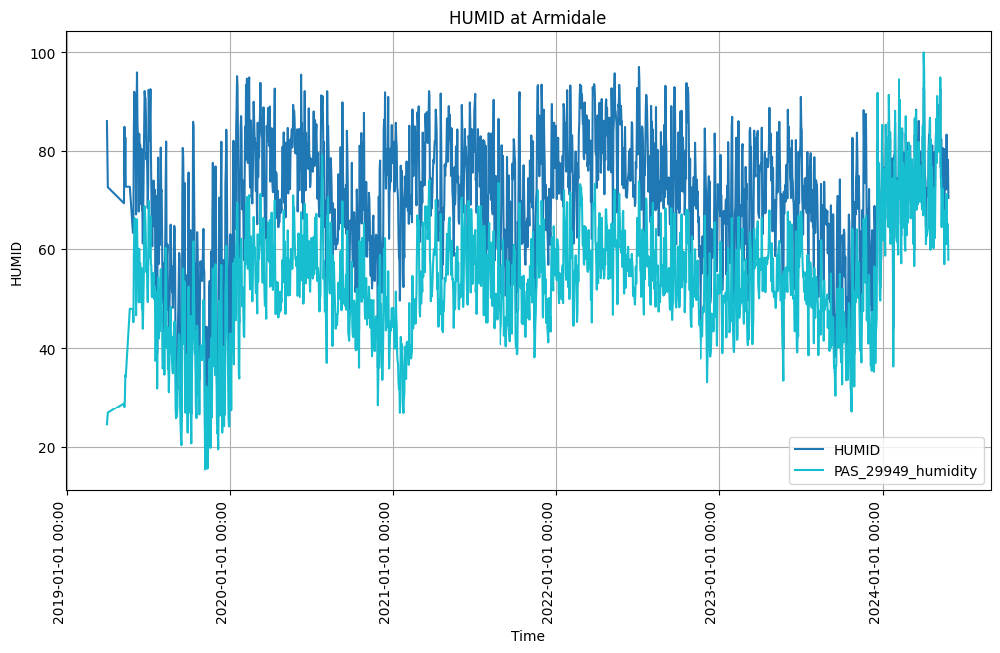

param TEMP
filename:  fig\eda\colocation\Armidale\tseries\20190401_20240531\HUMID\Armidale_TEMP_20190401_20240531_daily.png


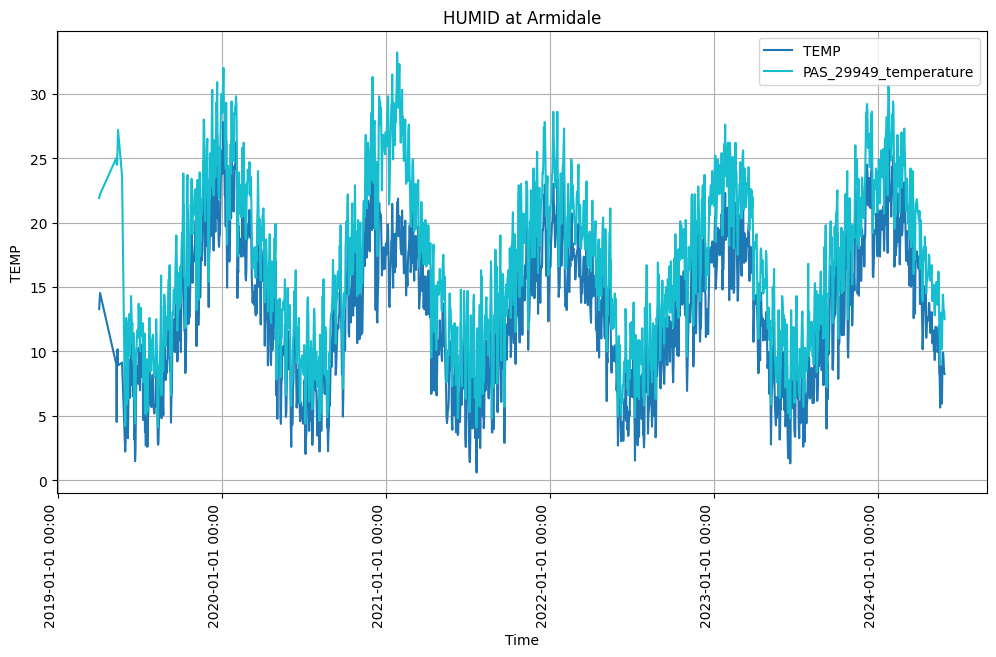

param PM2.5
filename:  fig\eda\colocation\Armidale\tseries\20190401_20240531\HUMID\Armidale_PM2.5_20190401_20240531_daily.png


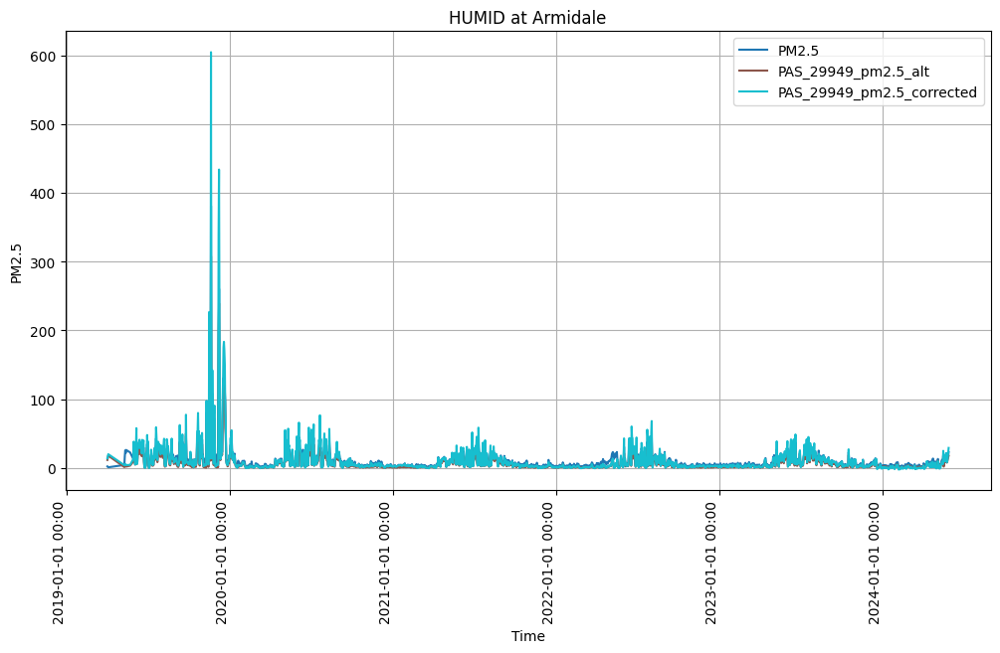

param PM10
filename:  fig\eda\colocation\Armidale\tseries\20190401_20240531\HUMID\Armidale_PM10_20190401_20240531_daily.png


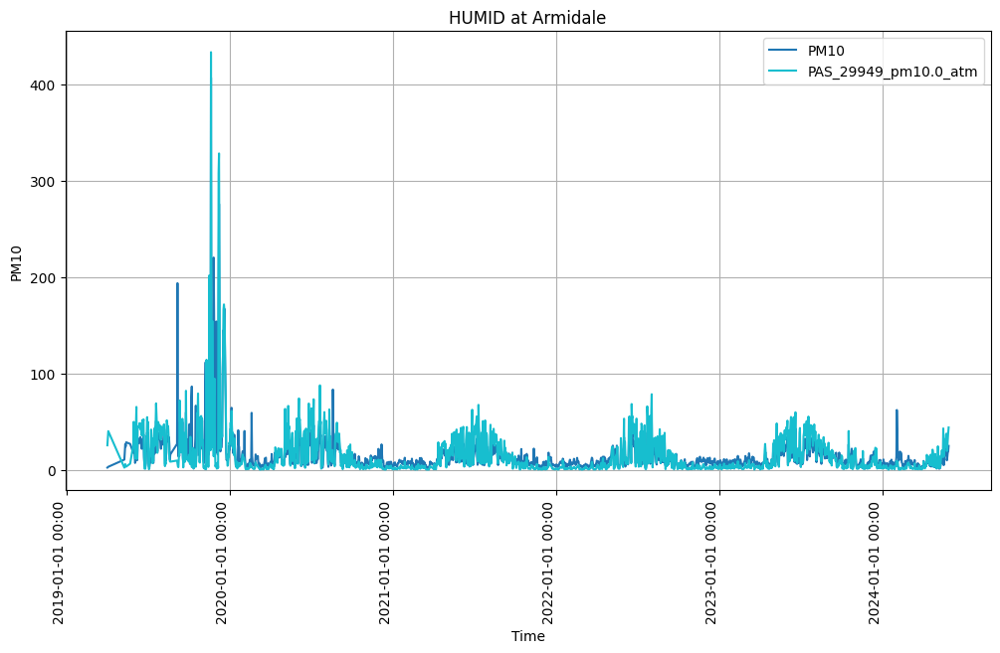

param HUMID
filename:  fig\eda\colocation\Armidale\tseries\20190401_20240531\TEMP\Armidale_HUMID_20190401_20240531_daily.png


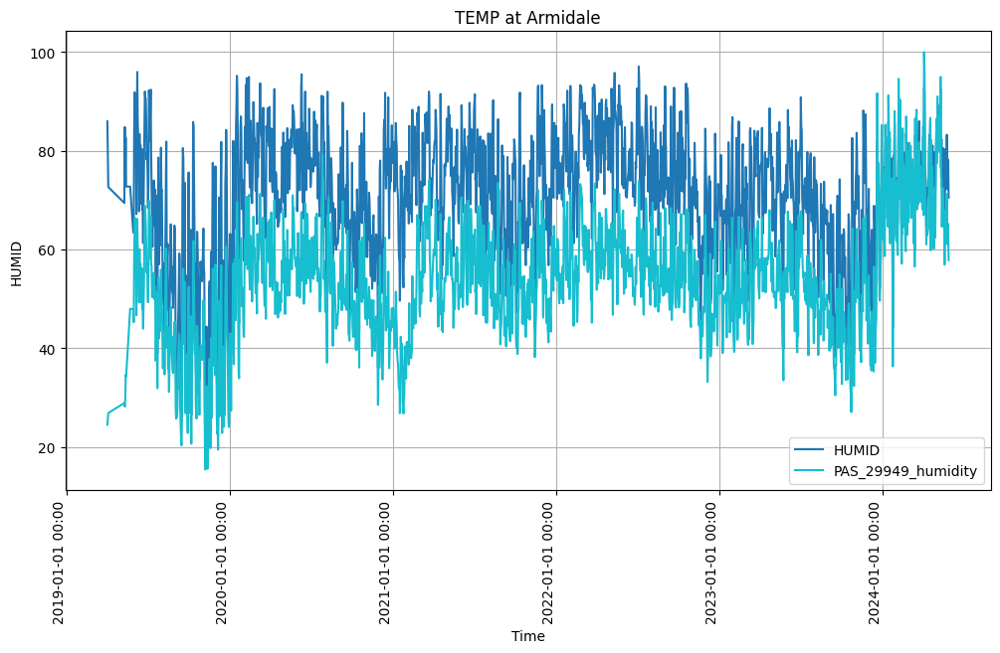

param TEMP
filename:  fig\eda\colocation\Armidale\tseries\20190401_20240531\TEMP\Armidale_TEMP_20190401_20240531_daily.png


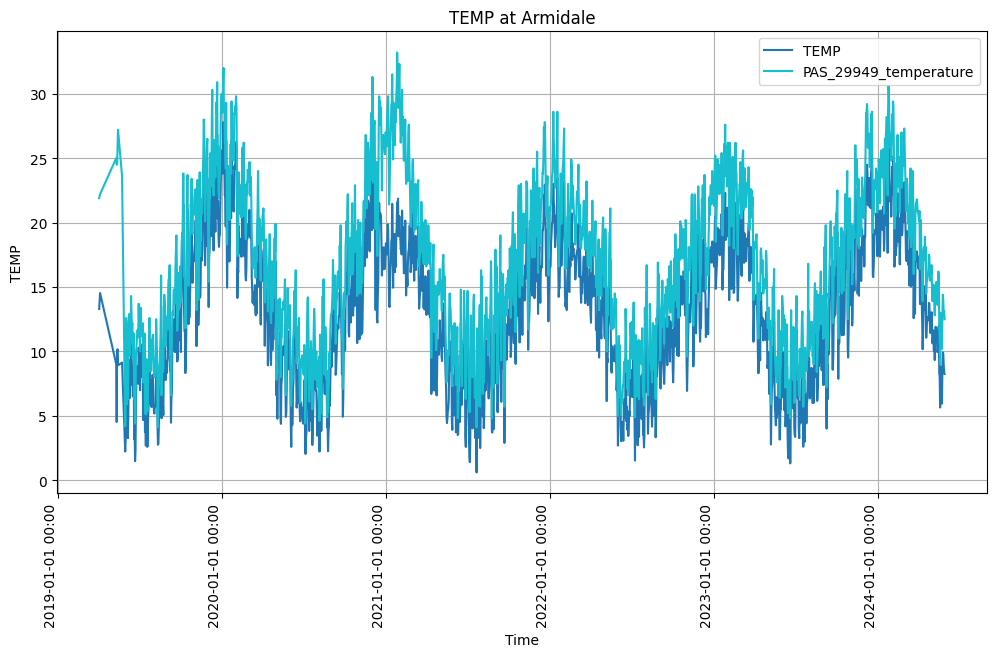

param PM2.5
filename:  fig\eda\colocation\Armidale\tseries\20190401_20240531\TEMP\Armidale_PM2.5_20190401_20240531_daily.png


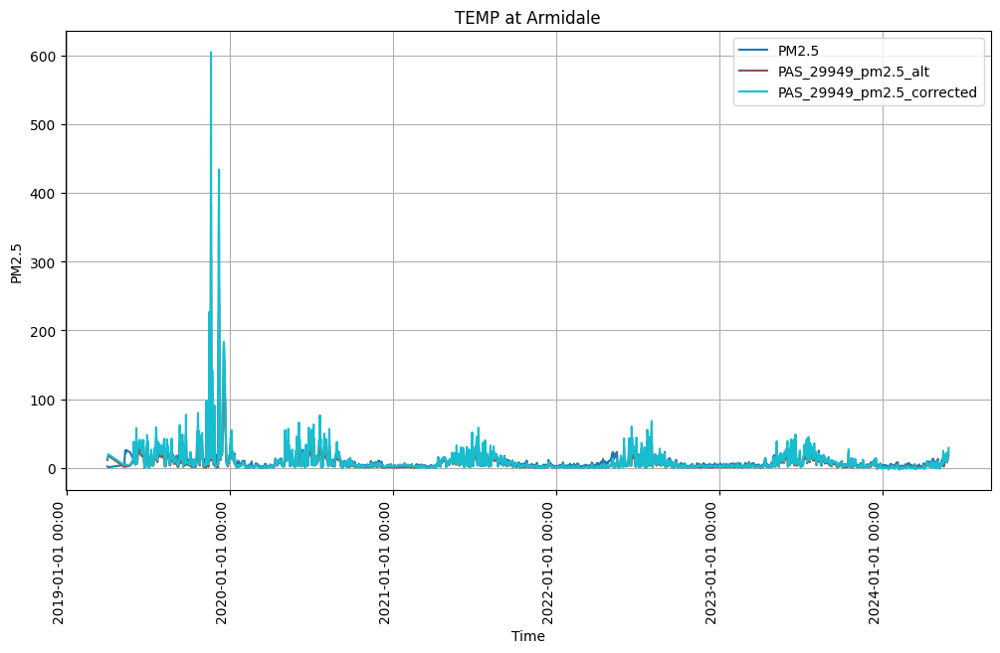

param PM10
filename:  fig\eda\colocation\Armidale\tseries\20190401_20240531\TEMP\Armidale_PM10_20190401_20240531_daily.png


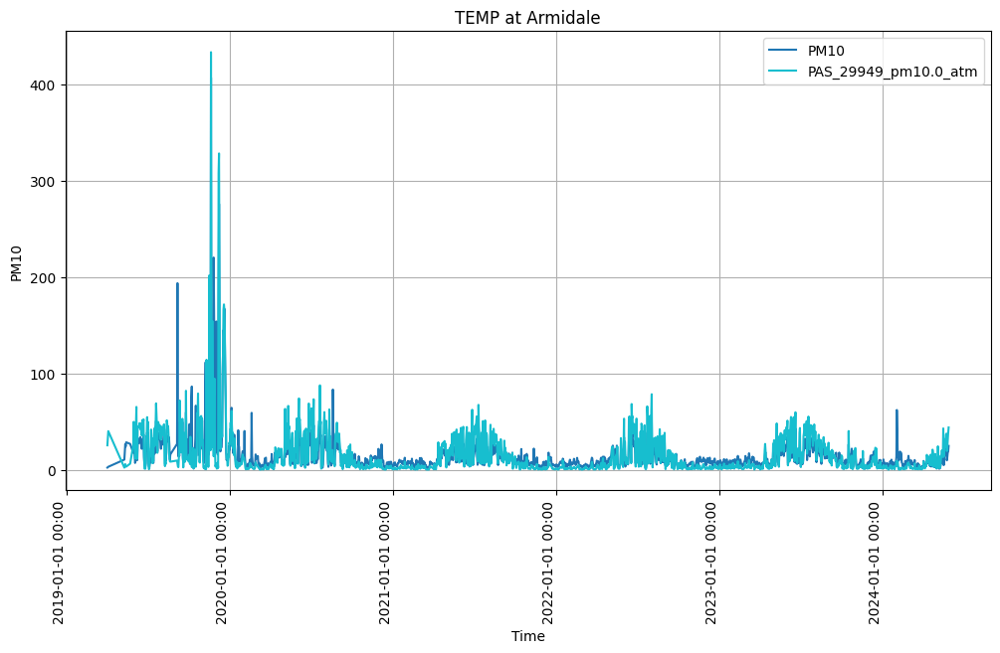

param HUMID
filename:  fig\eda\colocation\Armidale\tseries\20190401_20240531\PM2.5\Armidale_HUMID_20190401_20240531_daily.png


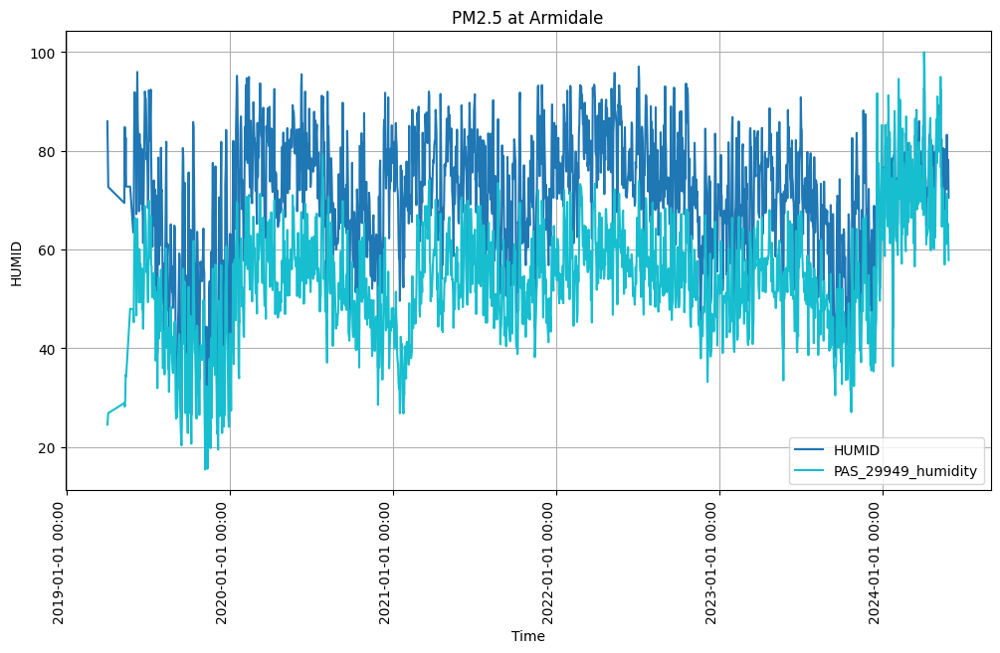

param TEMP
filename:  fig\eda\colocation\Armidale\tseries\20190401_20240531\PM2.5\Armidale_TEMP_20190401_20240531_daily.png


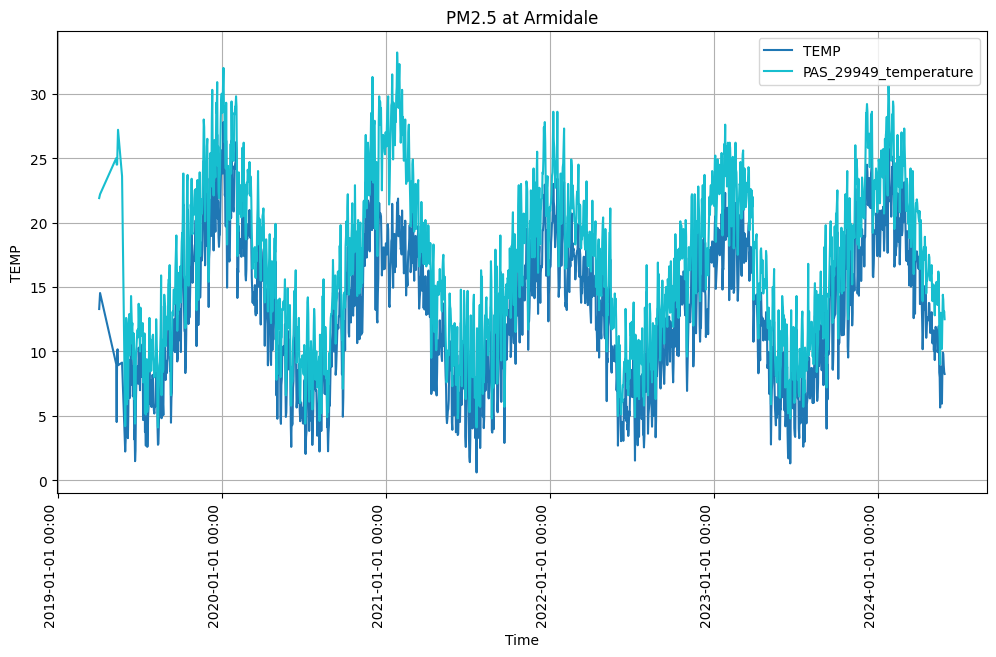

param PM2.5
filename:  fig\eda\colocation\Armidale\tseries\20190401_20240531\PM2.5\Armidale_PM2.5_20190401_20240531_daily.png


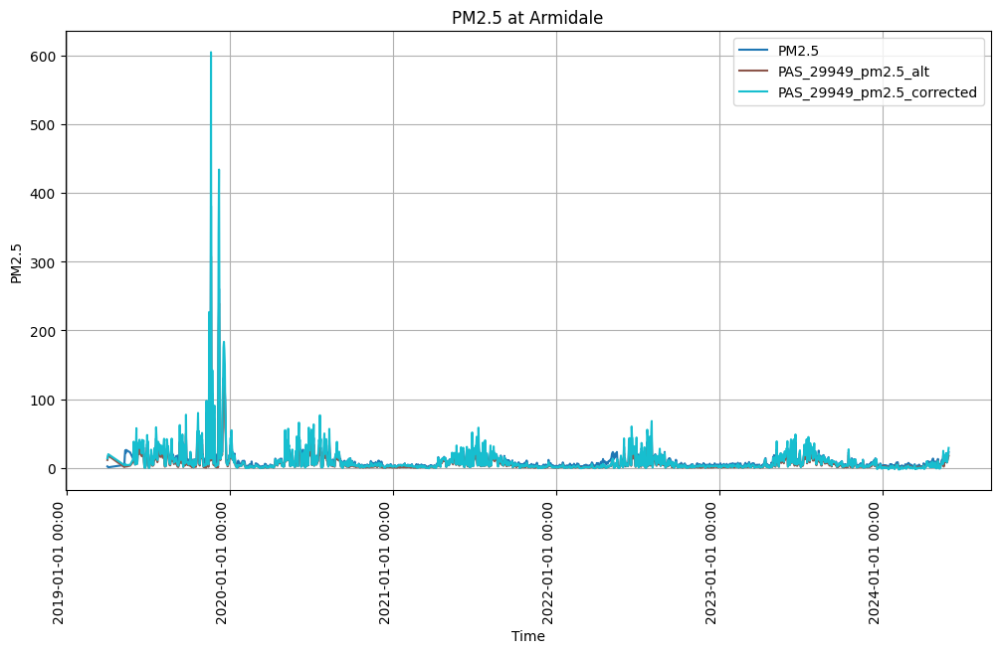

param PM10
filename:  fig\eda\colocation\Armidale\tseries\20190401_20240531\PM2.5\Armidale_PM10_20190401_20240531_daily.png


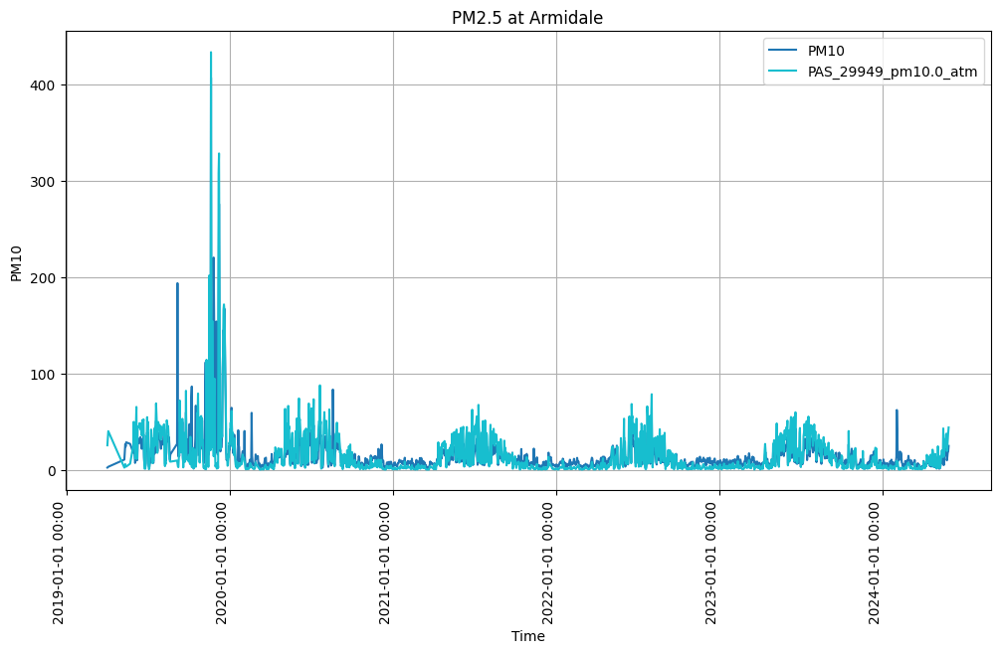

param HUMID
filename:  fig\eda\colocation\Armidale\tseries\20190401_20240531\PM10\Armidale_HUMID_20190401_20240531_daily.png


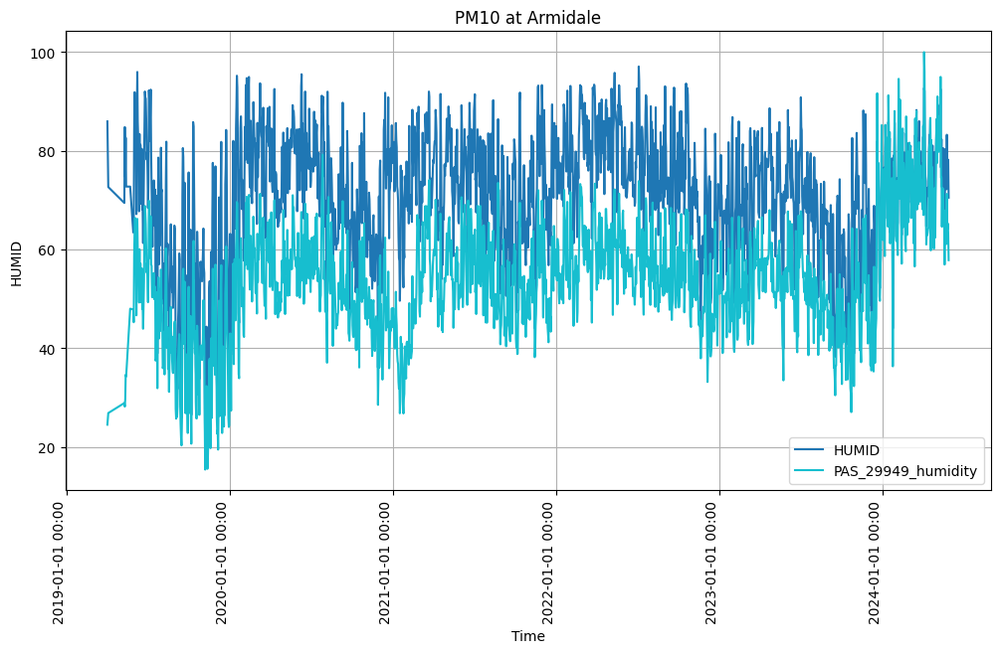

param TEMP
filename:  fig\eda\colocation\Armidale\tseries\20190401_20240531\PM10\Armidale_TEMP_20190401_20240531_daily.png


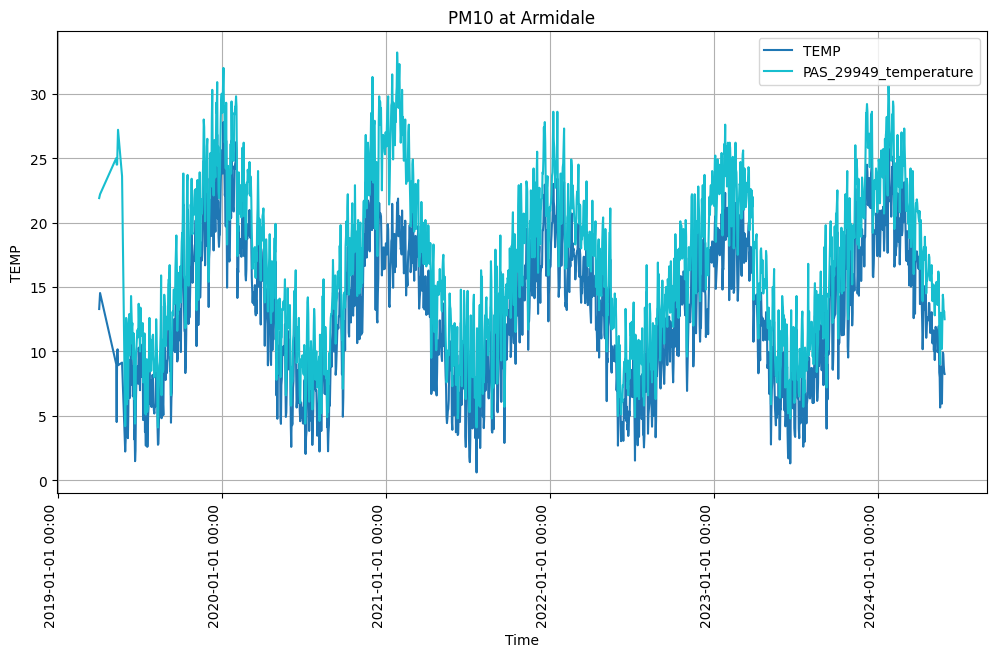

param PM2.5
filename:  fig\eda\colocation\Armidale\tseries\20190401_20240531\PM10\Armidale_PM2.5_20190401_20240531_daily.png


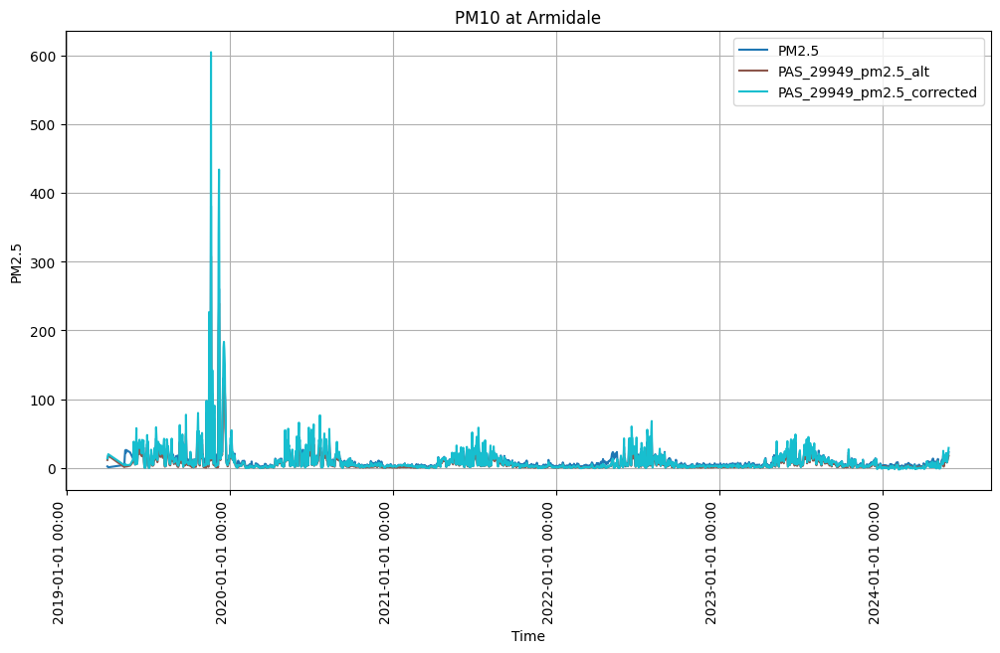

param PM10
filename:  fig\eda\colocation\Armidale\tseries\20190401_20240531\PM10\Armidale_PM10_20190401_20240531_daily.png


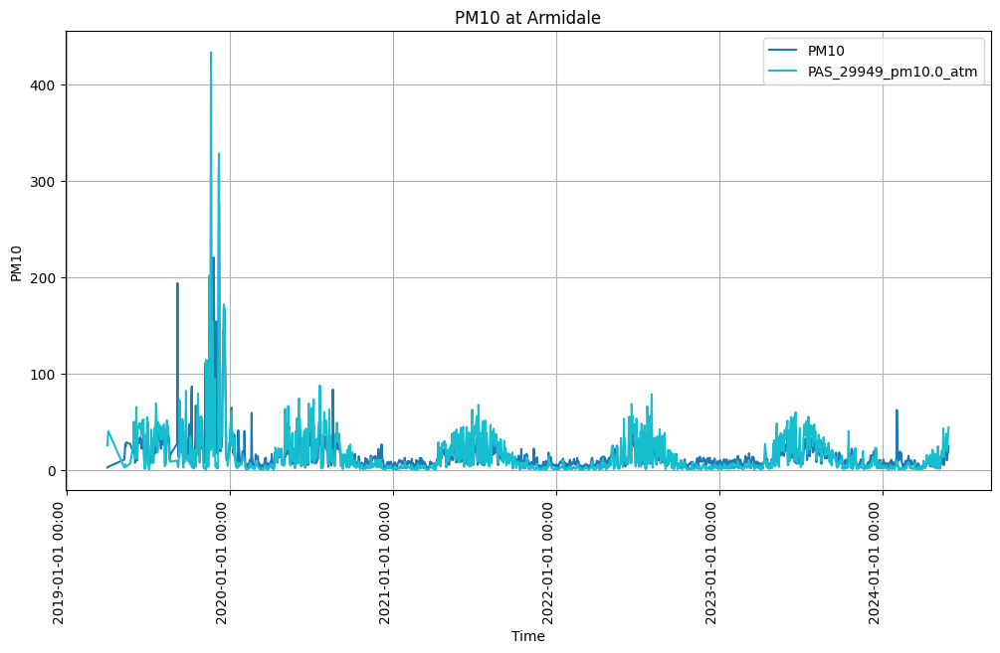

Site:  Bathurst
tseries_data plot data:  {'HUMID':                                HUMID  PAS_98435_humidity
datetime_utc                                            
2021-05-04 00:00:00+00:00  90.694167              56.000
2021-05-27 00:00:00+00:00  69.642583              42.067
2021-05-28 00:00:00+00:00  70.375833              40.606
2021-05-29 00:00:00+00:00  68.386375              46.546
2021-05-30 00:00:00+00:00  78.124542              53.664
...                              ...                 ...
2024-05-25 00:00:00+00:00  84.917792              62.755
2024-05-26 00:00:00+00:00  91.229000              65.996
2024-05-27 00:00:00+00:00  84.581375              60.597
2024-05-28 00:00:00+00:00  80.674292              56.489
2024-05-29 00:00:00+00:00  80.278708              58.001

[1064 rows x 2 columns], 'TEMP':                                 TEMP  PAS_98435_temperature
datetime_utc                                               
2021-05-04 00:00:00+00:00  10.276792                  

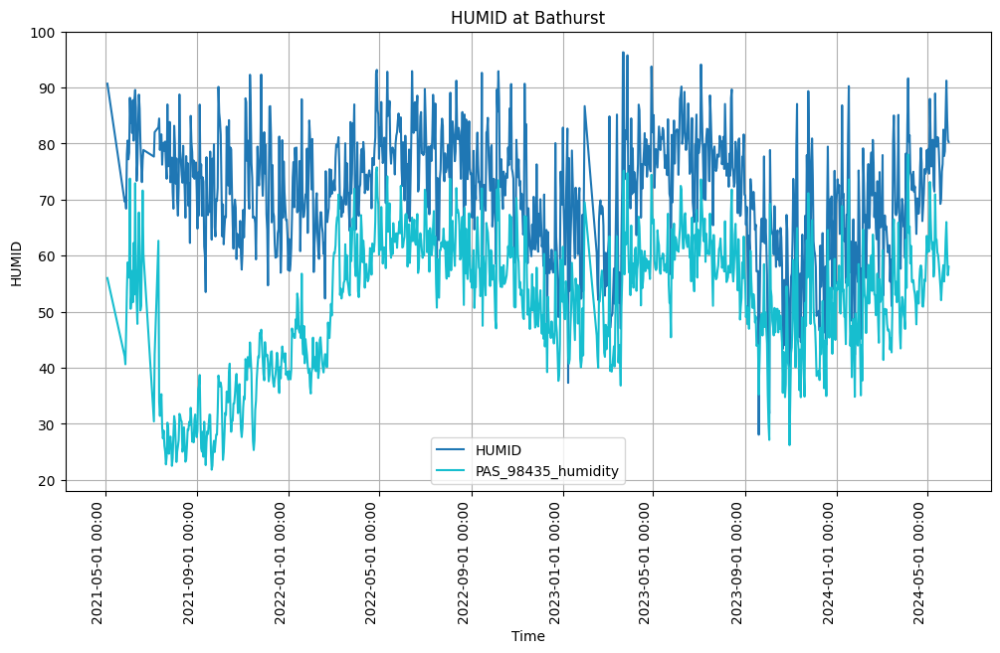

param TEMP
filename:  fig\eda\colocation\Bathurst\tseries\20210201_20240531\HUMID\Bathurst_TEMP_20210201_20240531_daily.png


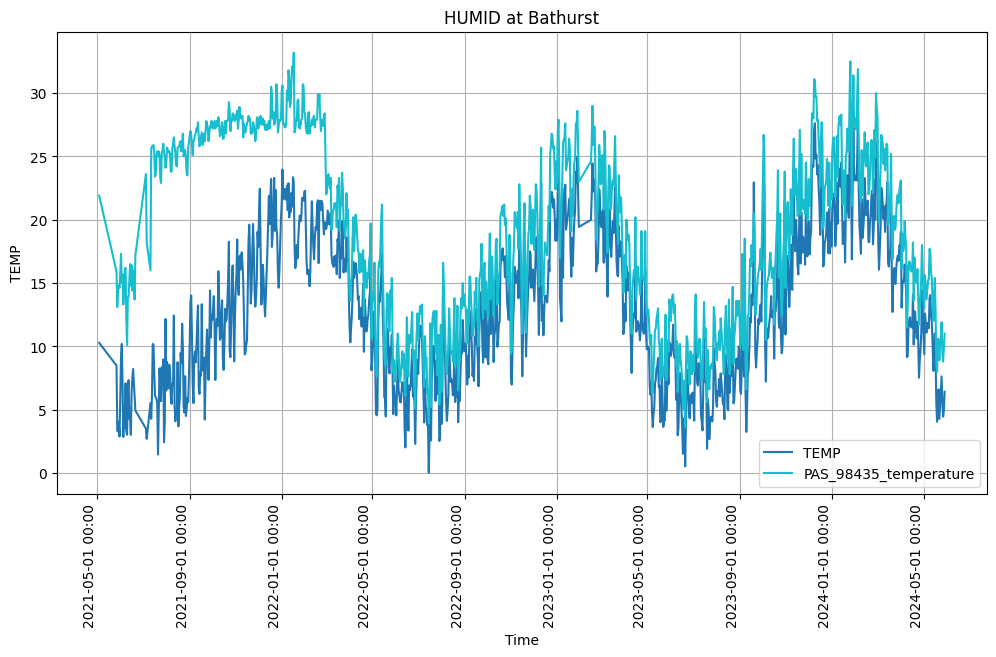

param PM2.5
filename:  fig\eda\colocation\Bathurst\tseries\20210201_20240531\HUMID\Bathurst_PM2.5_20210201_20240531_daily.png


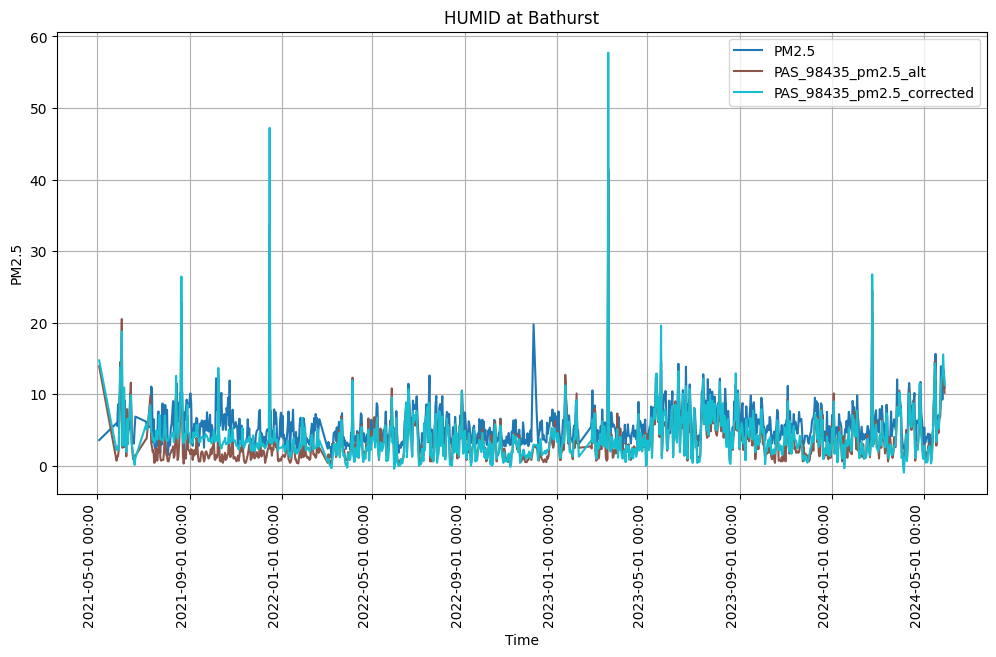

param PM10
filename:  fig\eda\colocation\Bathurst\tseries\20210201_20240531\HUMID\Bathurst_PM10_20210201_20240531_daily.png


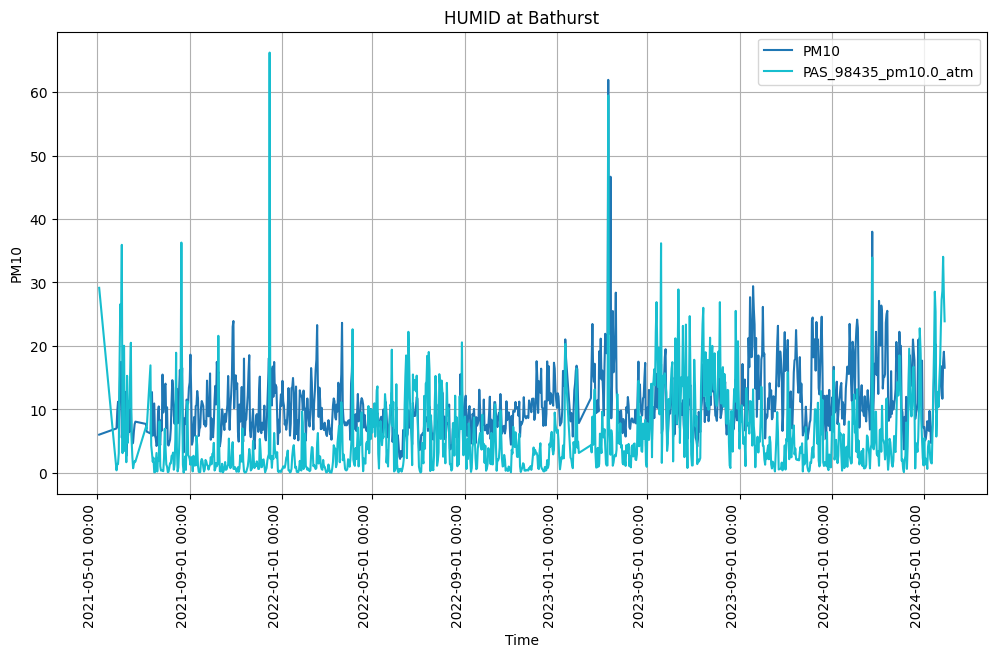

param HUMID
filename:  fig\eda\colocation\Bathurst\tseries\20210201_20240531\TEMP\Bathurst_HUMID_20210201_20240531_daily.png


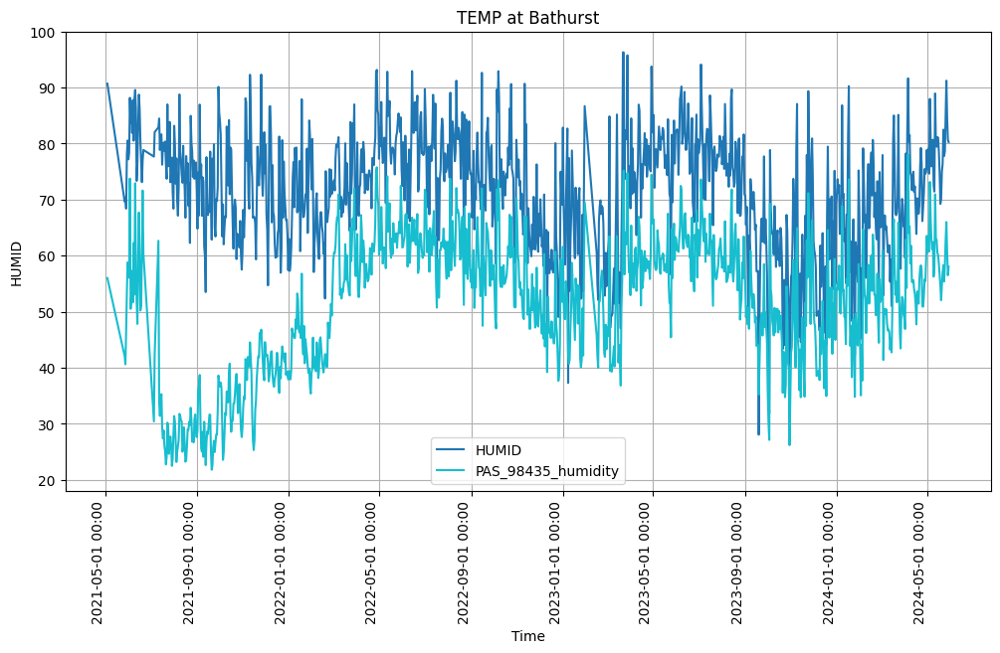

param TEMP
filename:  fig\eda\colocation\Bathurst\tseries\20210201_20240531\TEMP\Bathurst_TEMP_20210201_20240531_daily.png


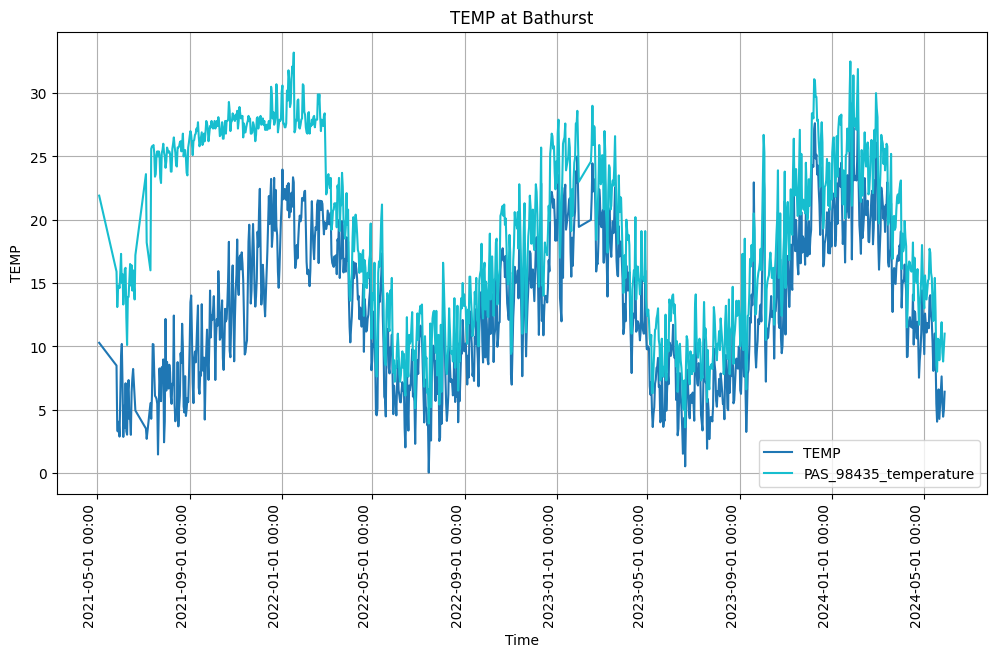

param PM2.5
filename:  fig\eda\colocation\Bathurst\tseries\20210201_20240531\TEMP\Bathurst_PM2.5_20210201_20240531_daily.png


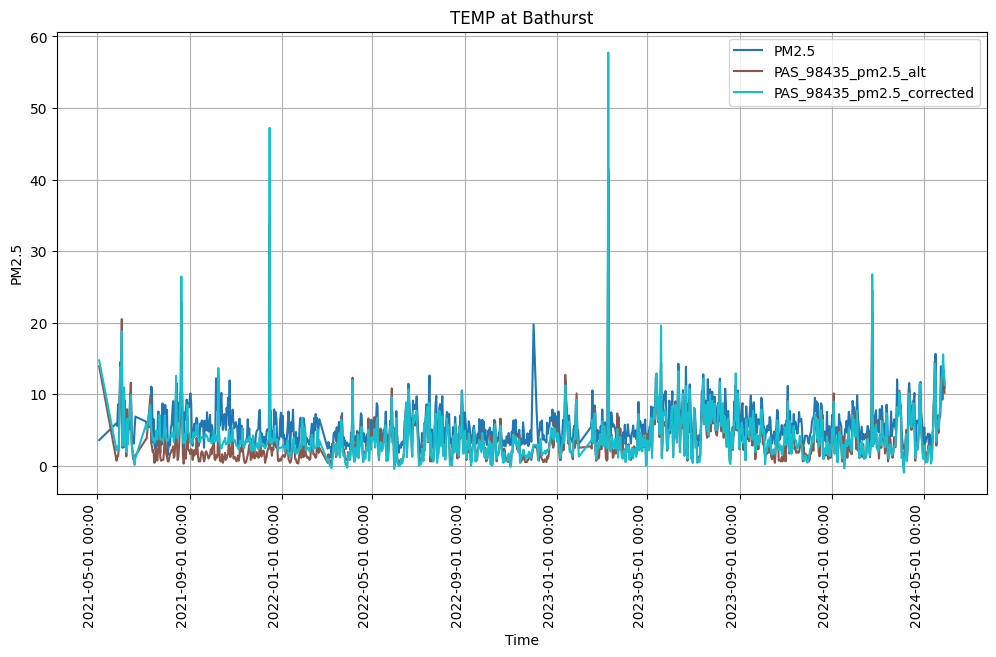

param PM10
filename:  fig\eda\colocation\Bathurst\tseries\20210201_20240531\TEMP\Bathurst_PM10_20210201_20240531_daily.png


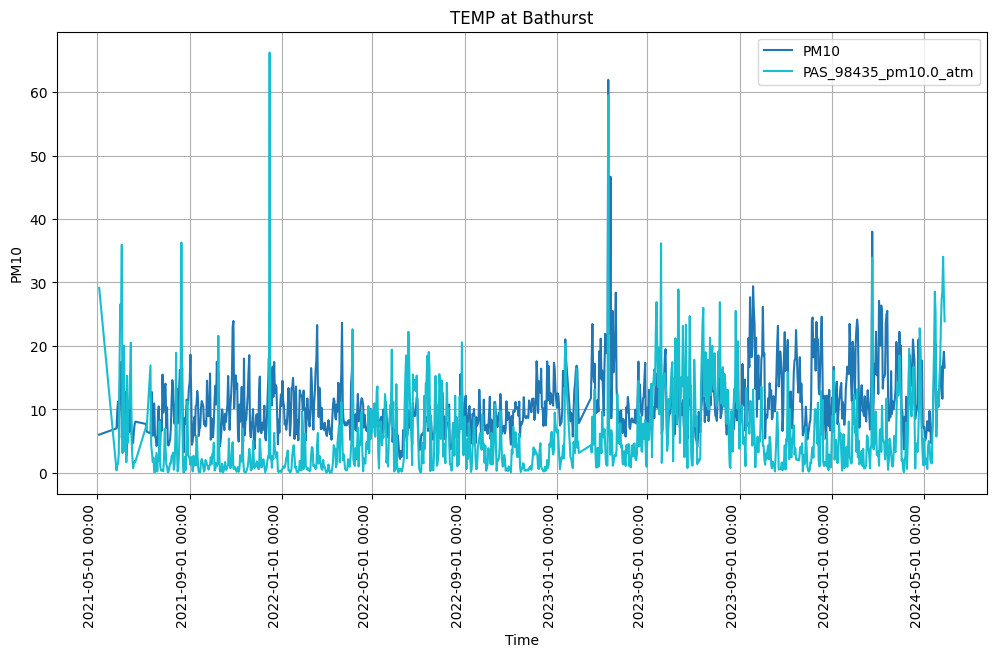

param HUMID
filename:  fig\eda\colocation\Bathurst\tseries\20210201_20240531\PM2.5\Bathurst_HUMID_20210201_20240531_daily.png


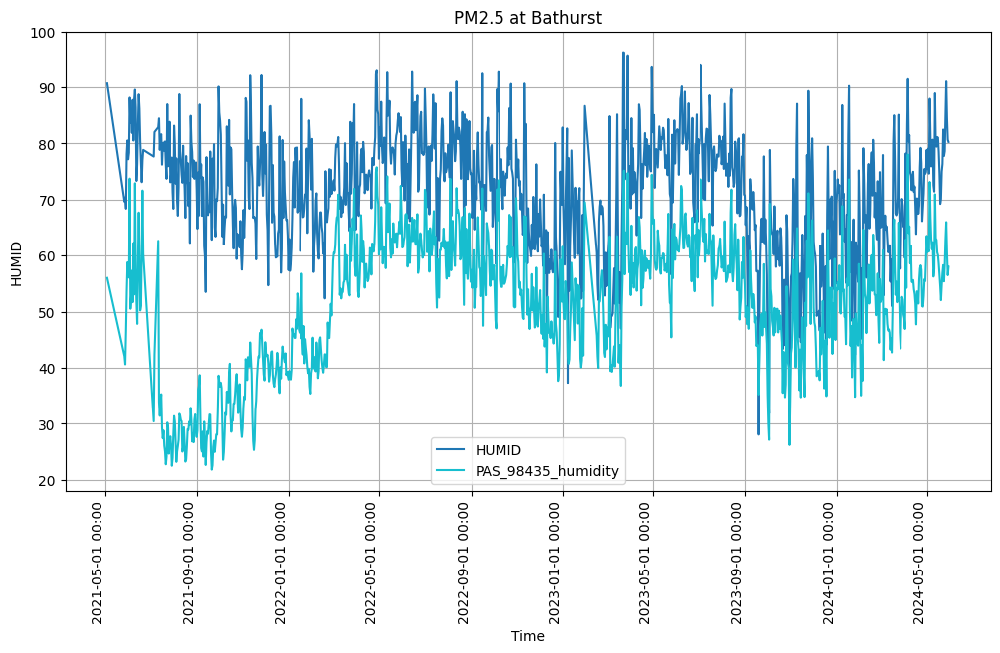

param TEMP
filename:  fig\eda\colocation\Bathurst\tseries\20210201_20240531\PM2.5\Bathurst_TEMP_20210201_20240531_daily.png


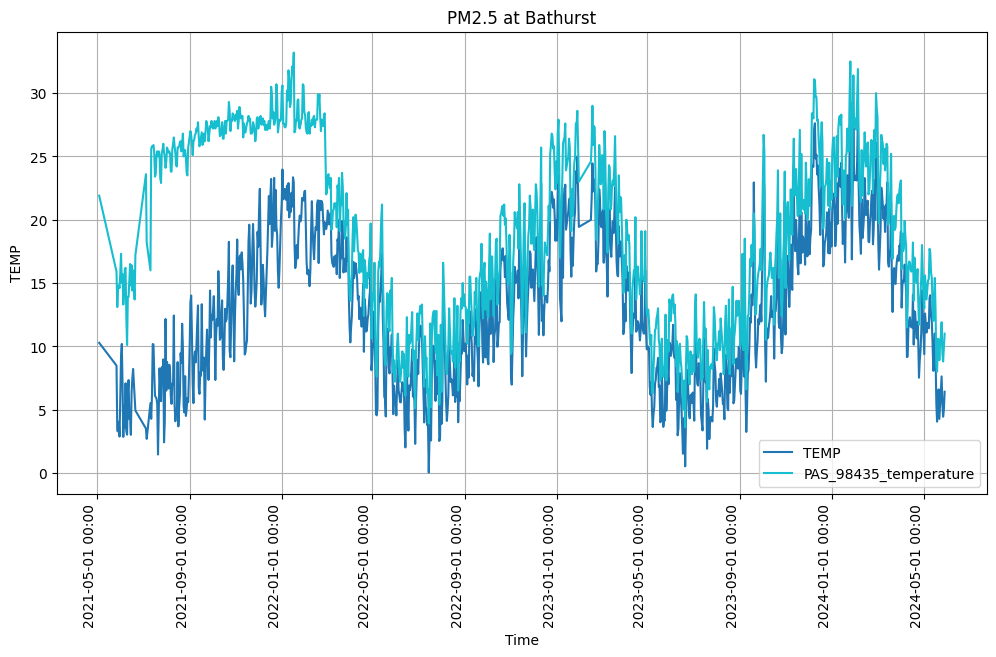

param PM2.5
filename:  fig\eda\colocation\Bathurst\tseries\20210201_20240531\PM2.5\Bathurst_PM2.5_20210201_20240531_daily.png


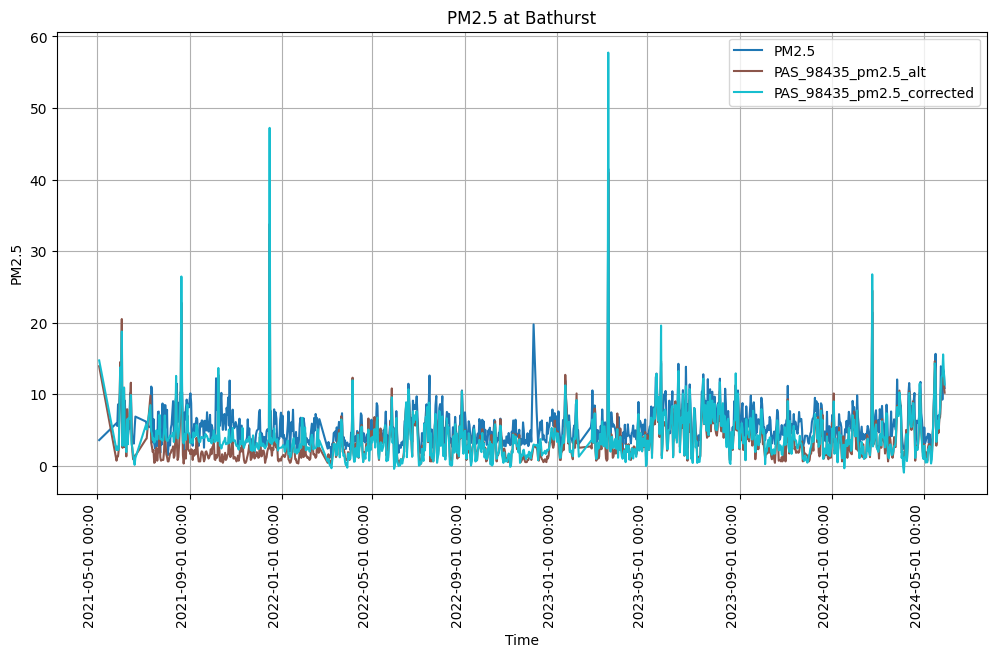

param PM10
filename:  fig\eda\colocation\Bathurst\tseries\20210201_20240531\PM2.5\Bathurst_PM10_20210201_20240531_daily.png


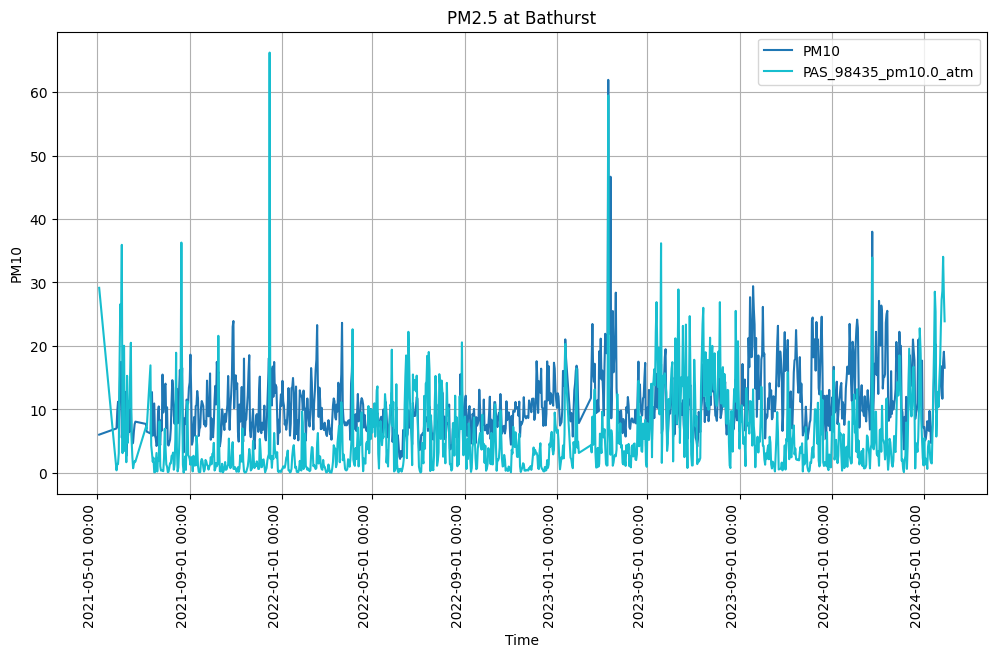

param HUMID
filename:  fig\eda\colocation\Bathurst\tseries\20210201_20240531\PM10\Bathurst_HUMID_20210201_20240531_daily.png


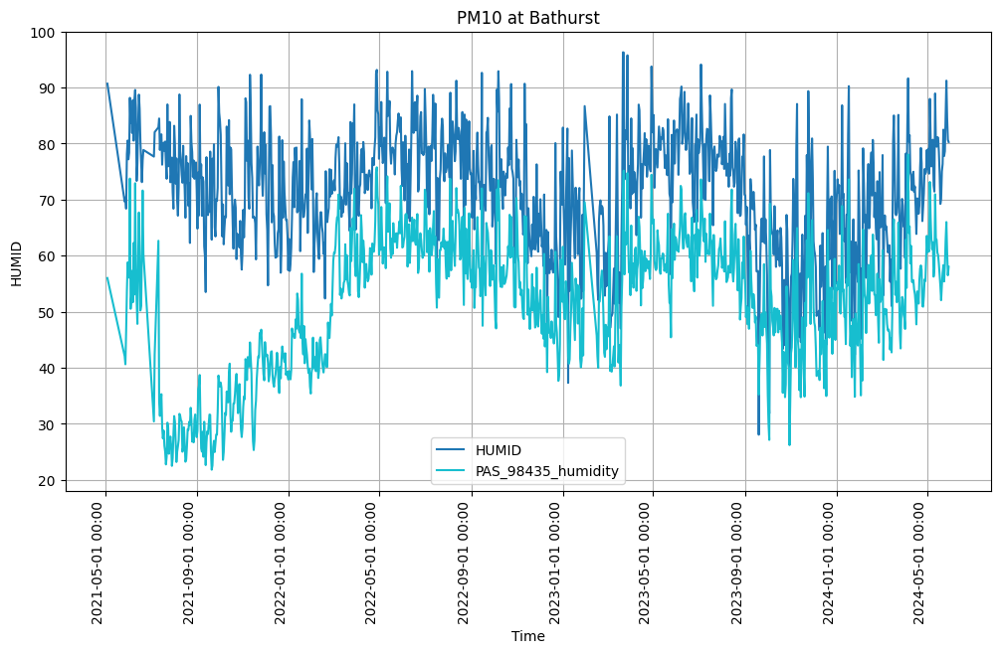

param TEMP
filename:  fig\eda\colocation\Bathurst\tseries\20210201_20240531\PM10\Bathurst_TEMP_20210201_20240531_daily.png


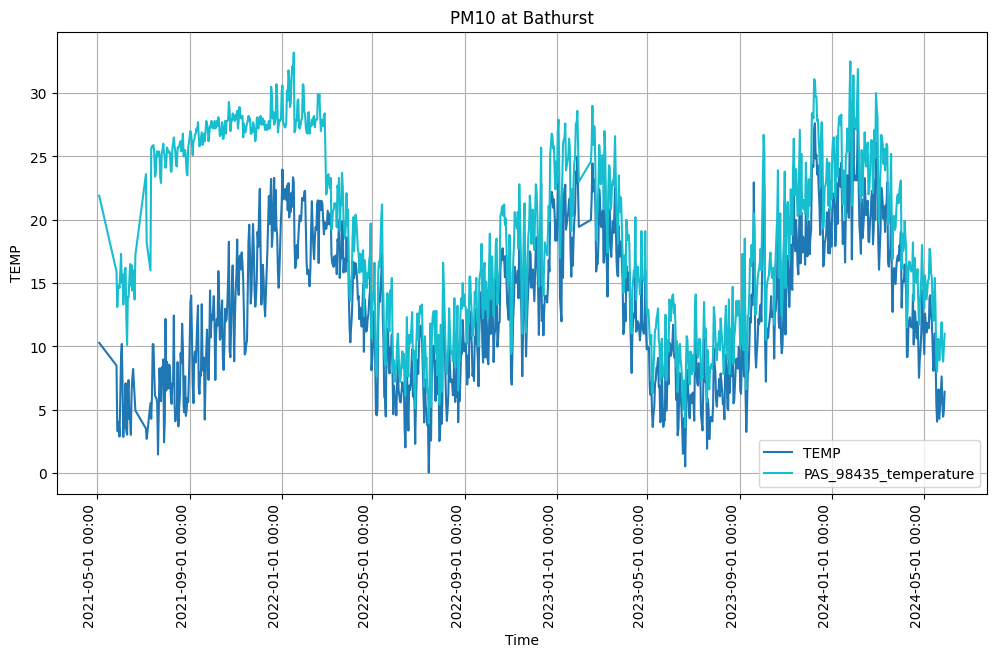

param PM2.5
filename:  fig\eda\colocation\Bathurst\tseries\20210201_20240531\PM10\Bathurst_PM2.5_20210201_20240531_daily.png


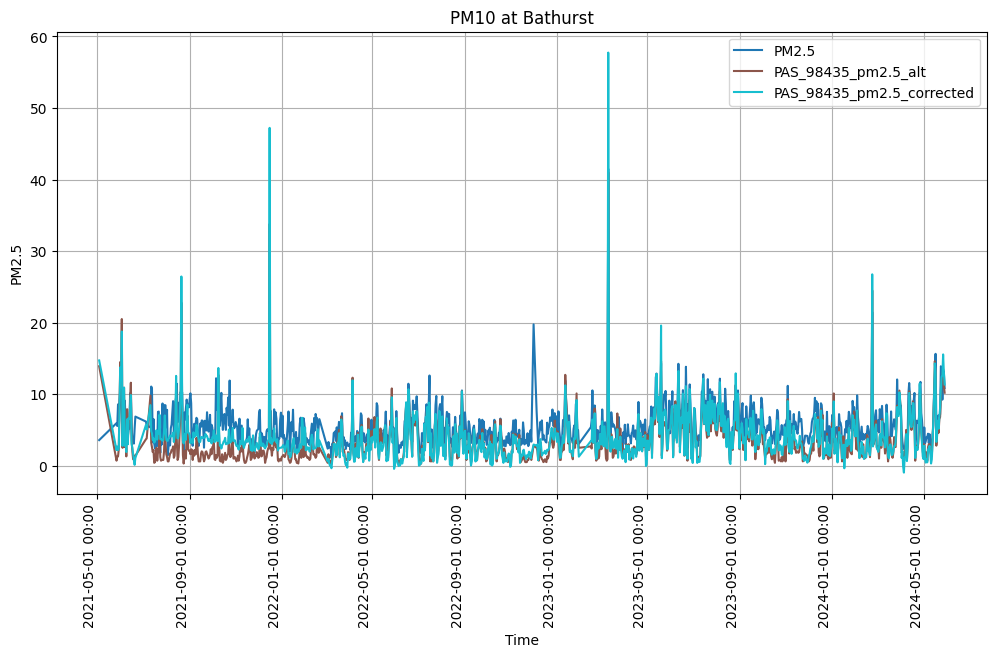

param PM10
filename:  fig\eda\colocation\Bathurst\tseries\20210201_20240531\PM10\Bathurst_PM10_20210201_20240531_daily.png


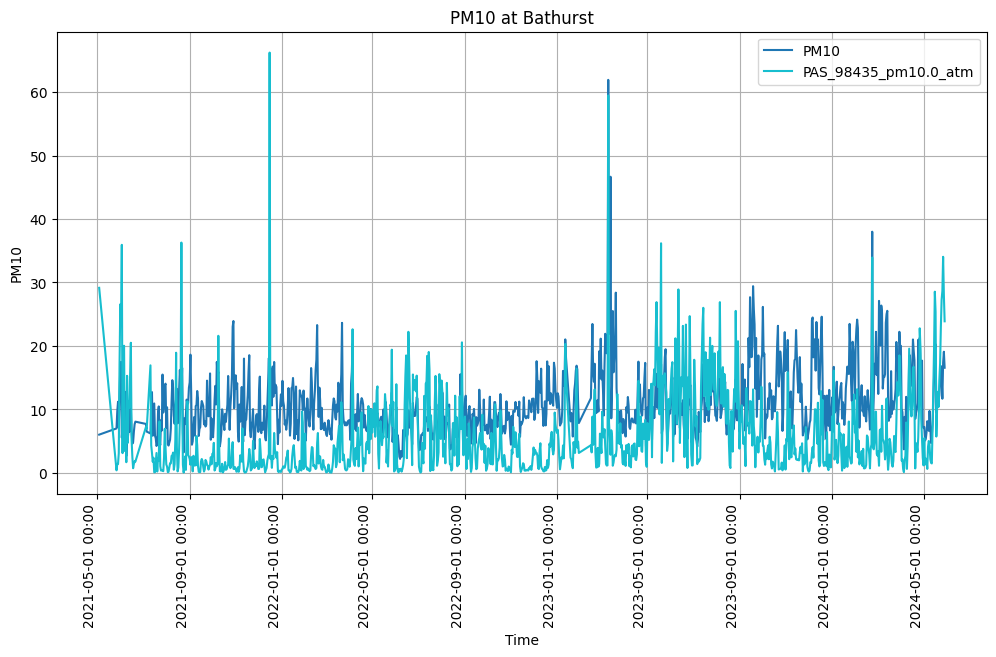

Site:  Lidcombe
tseries_data plot data:  {'HUMID':                                HUMID  PAS_91721_humidity  PAS_92367_humidity  \
datetime_utc                                                                   
2021-02-28 00:00:00+00:00  88.666100              41.968              43.580   
2021-03-01 00:00:00+00:00  66.566875              40.790              42.651   
2021-03-02 00:00:00+00:00  58.344435              35.851              37.527   
2021-03-03 00:00:00+00:00  63.645250              35.897              37.793   
2021-03-04 00:00:00+00:00  60.290417              35.528              39.178   
...                              ...                 ...                 ...   
2023-12-25 00:00:00+00:00  77.769792              56.926              61.273   
2023-12-26 00:00:00+00:00  78.405750              55.876              60.553   
2023-12-27 00:00:00+00:00  78.933917              55.514              60.444   
2023-12-28 00:00:00+00:00  67.370625              47.378             

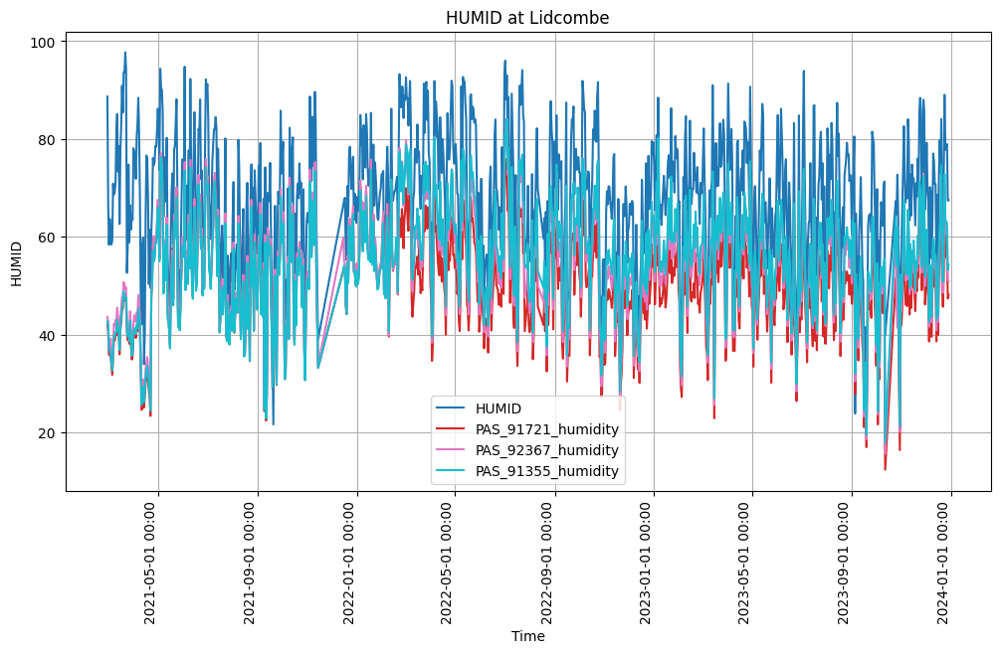

param TEMP
filename:  fig\eda\colocation\Lidcombe\tseries\20210301_20231231\HUMID\Lidcombe_TEMP_20210301_20231231_daily.png


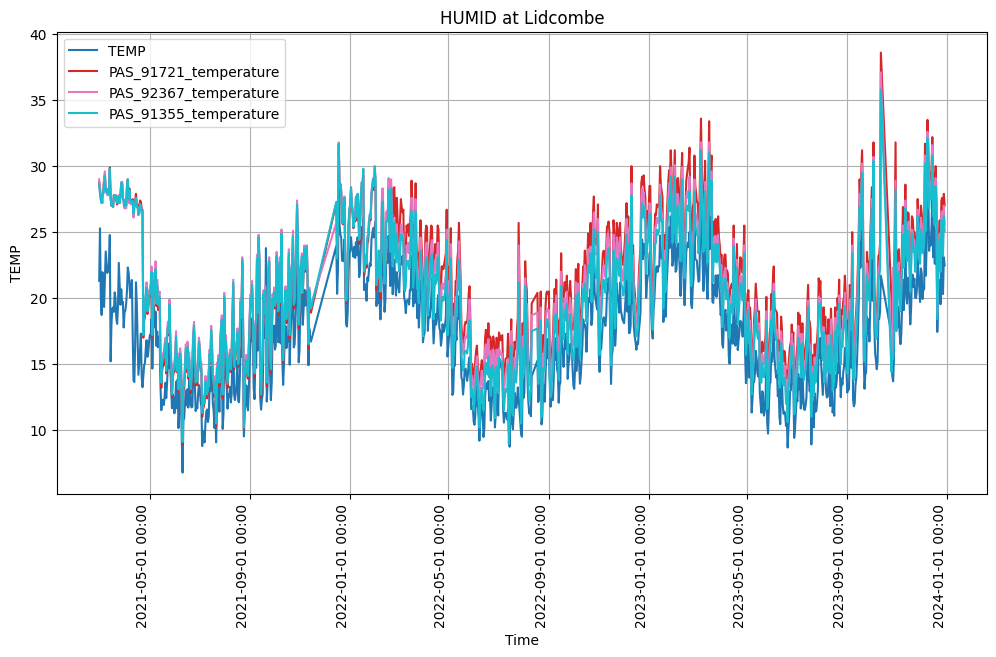

param PM2.5
filename:  fig\eda\colocation\Lidcombe\tseries\20210301_20231231\HUMID\Lidcombe_PM2.5_20210301_20231231_daily.png


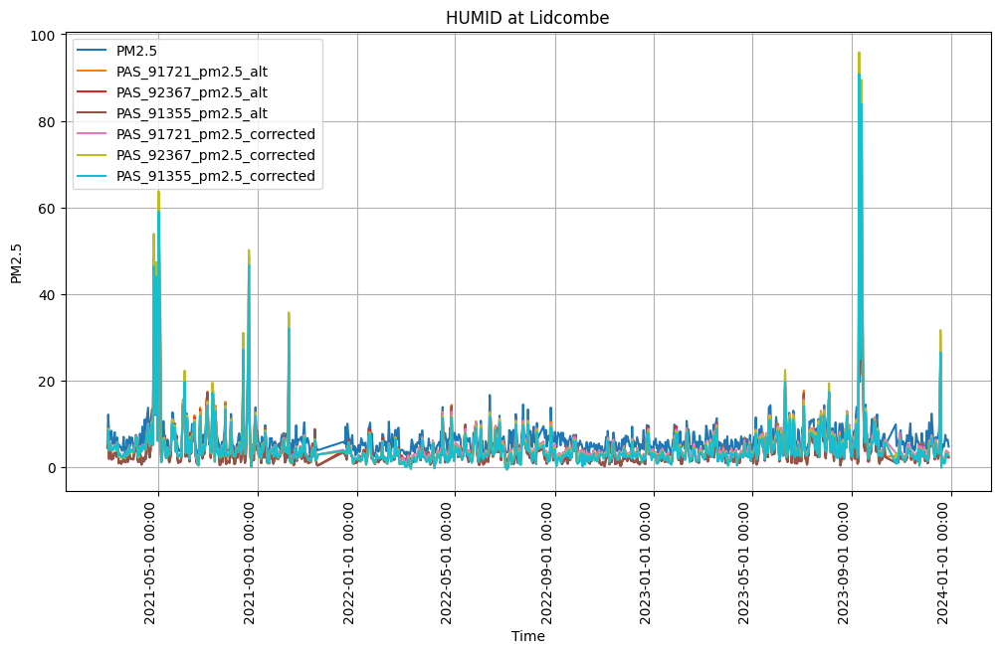

param PM10
filename:  fig\eda\colocation\Lidcombe\tseries\20210301_20231231\HUMID\Lidcombe_PM10_20210301_20231231_daily.png


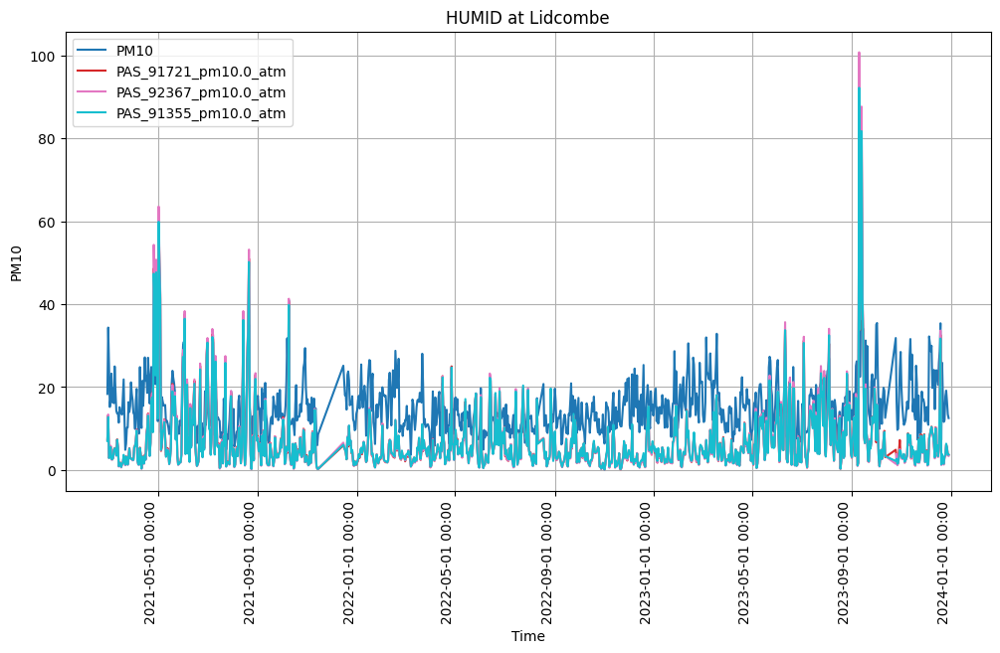

param HUMID
filename:  fig\eda\colocation\Lidcombe\tseries\20210301_20231231\TEMP\Lidcombe_HUMID_20210301_20231231_daily.png


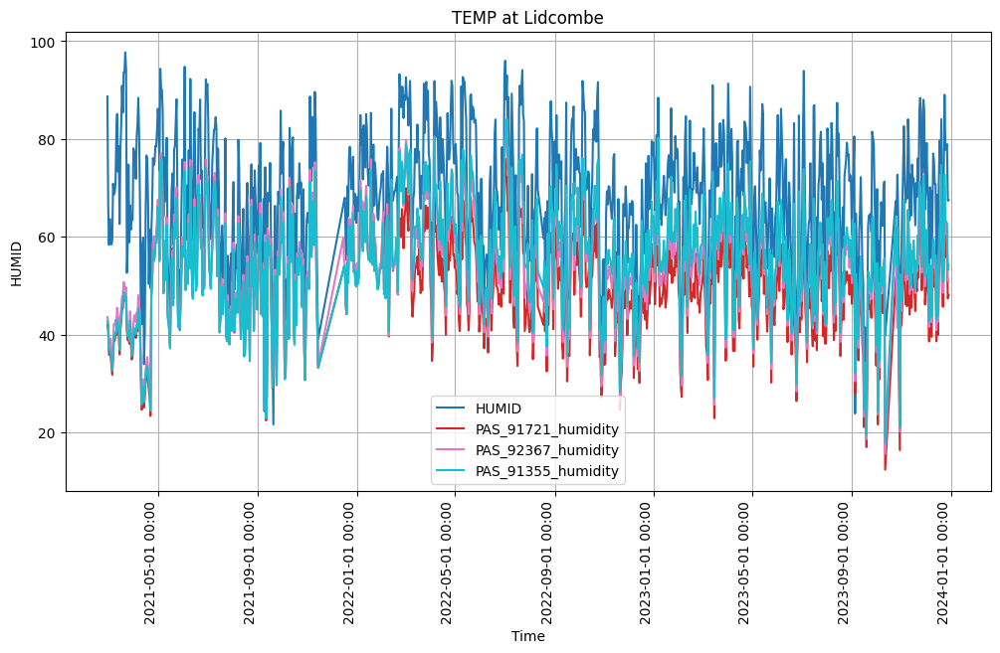

param TEMP
filename:  fig\eda\colocation\Lidcombe\tseries\20210301_20231231\TEMP\Lidcombe_TEMP_20210301_20231231_daily.png


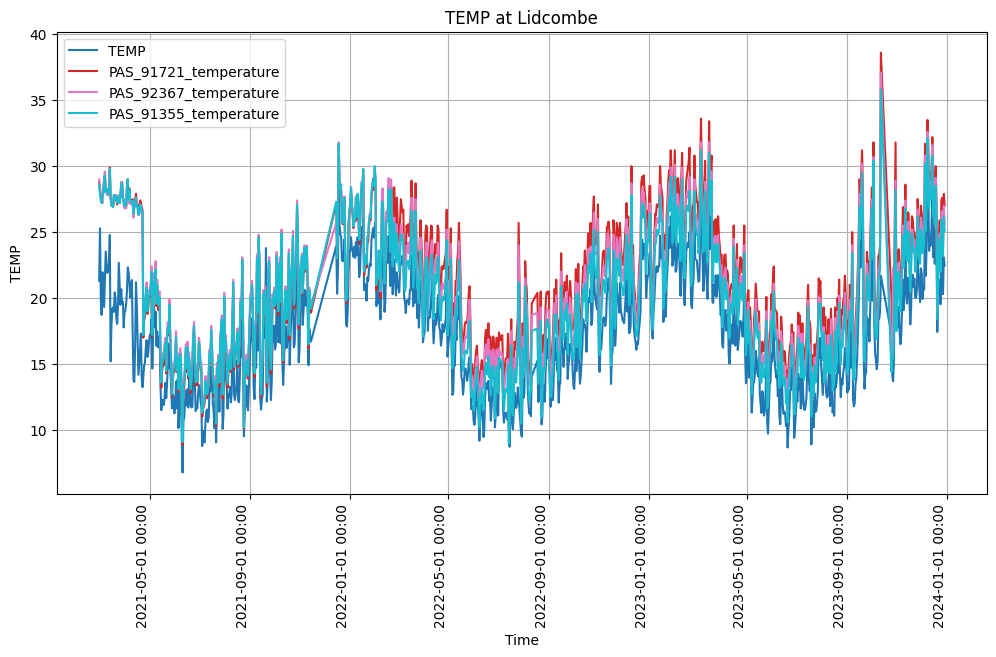

param PM2.5
filename:  fig\eda\colocation\Lidcombe\tseries\20210301_20231231\TEMP\Lidcombe_PM2.5_20210301_20231231_daily.png


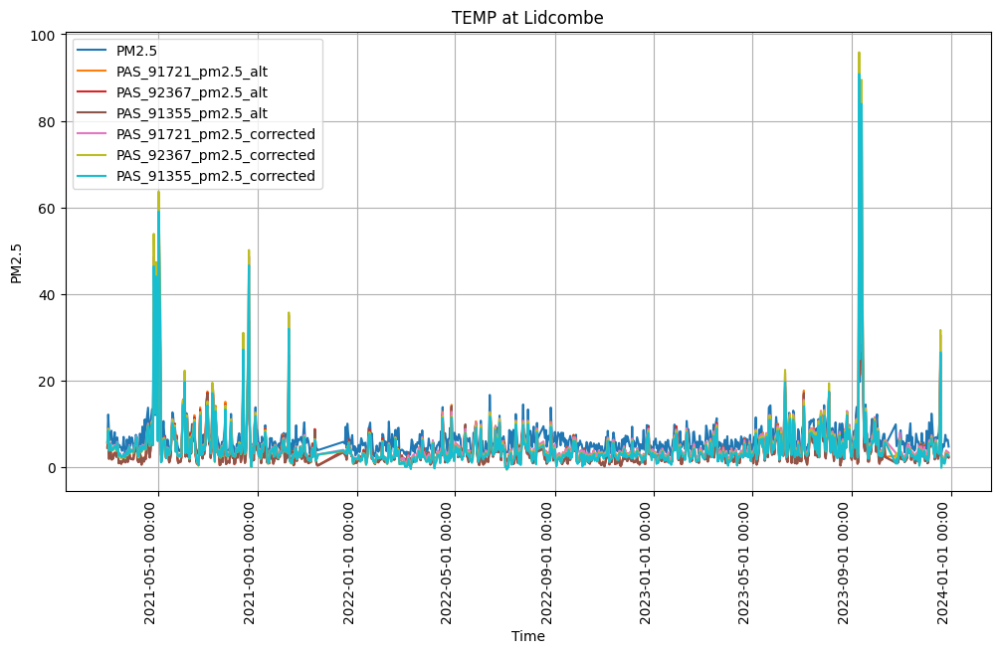

param PM10
filename:  fig\eda\colocation\Lidcombe\tseries\20210301_20231231\TEMP\Lidcombe_PM10_20210301_20231231_daily.png


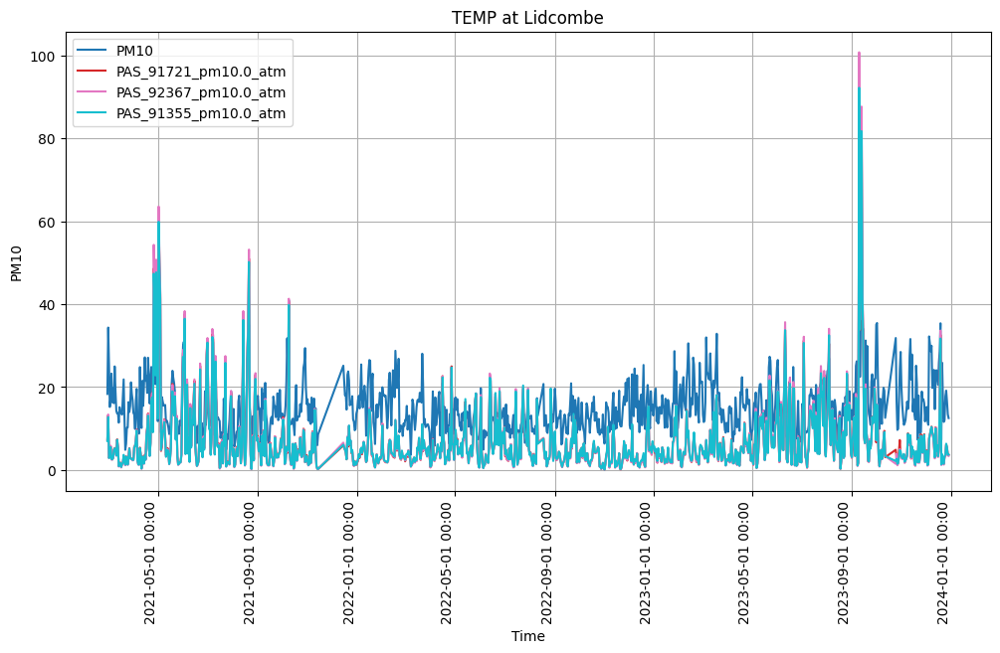

param HUMID
filename:  fig\eda\colocation\Lidcombe\tseries\20210301_20231231\PM2.5\Lidcombe_HUMID_20210301_20231231_daily.png


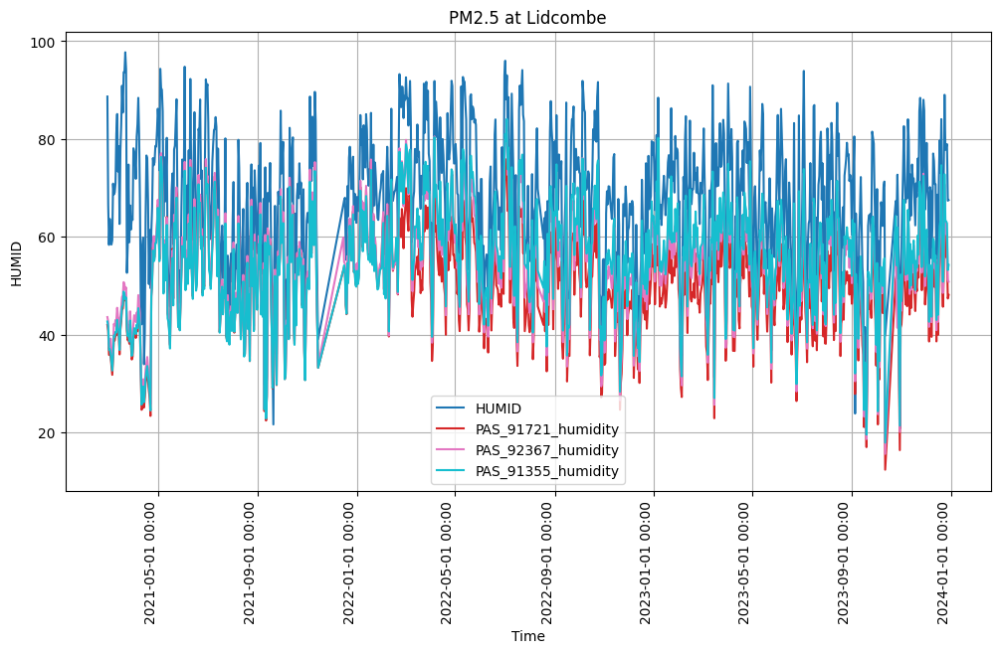

param TEMP
filename:  fig\eda\colocation\Lidcombe\tseries\20210301_20231231\PM2.5\Lidcombe_TEMP_20210301_20231231_daily.png


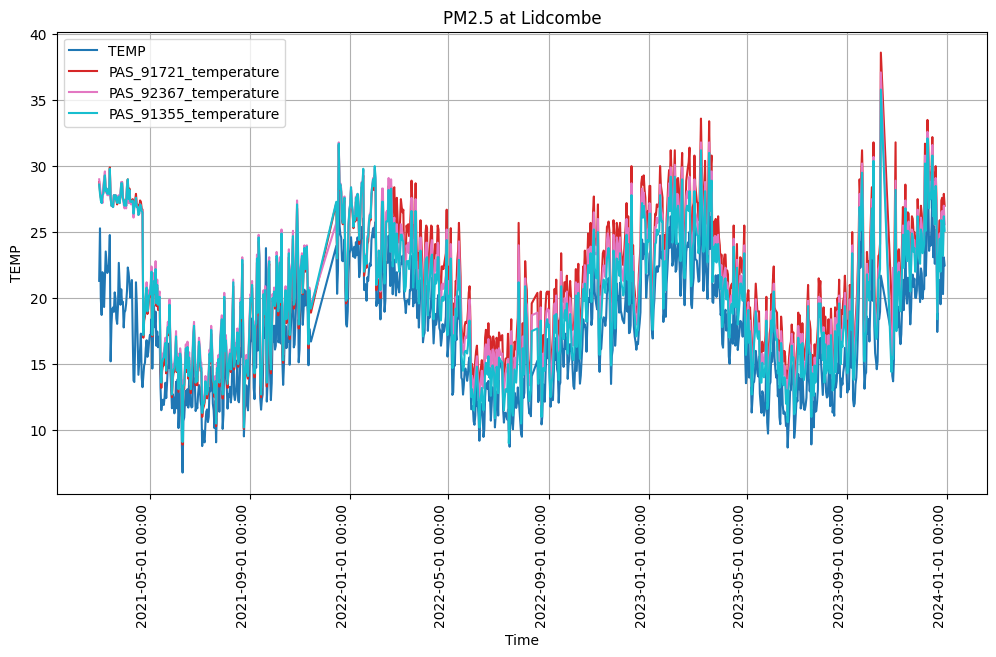

param PM2.5
filename:  fig\eda\colocation\Lidcombe\tseries\20210301_20231231\PM2.5\Lidcombe_PM2.5_20210301_20231231_daily.png


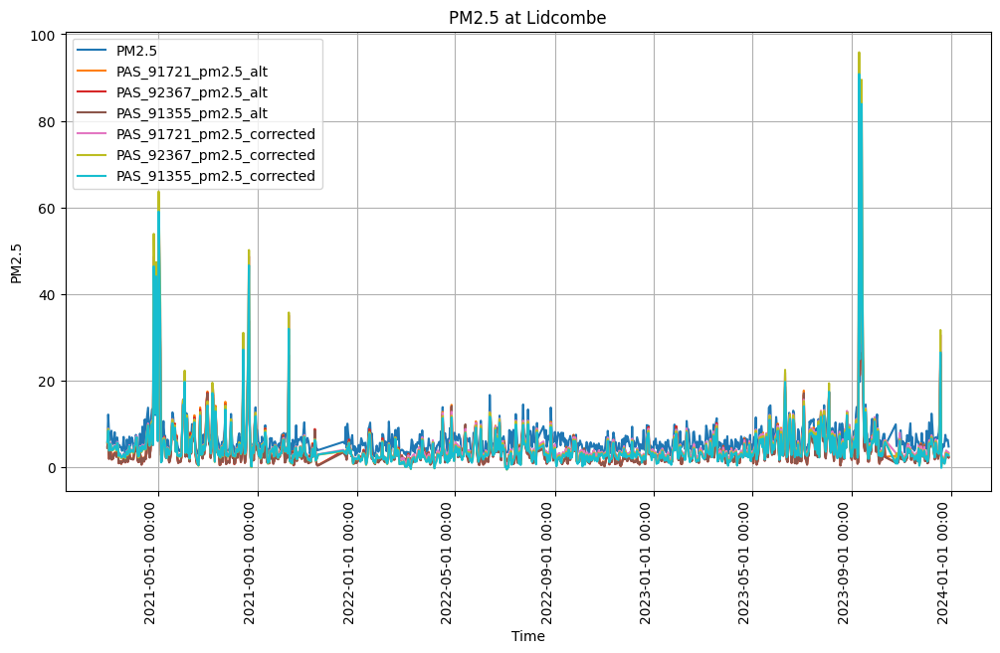

param PM10
filename:  fig\eda\colocation\Lidcombe\tseries\20210301_20231231\PM2.5\Lidcombe_PM10_20210301_20231231_daily.png


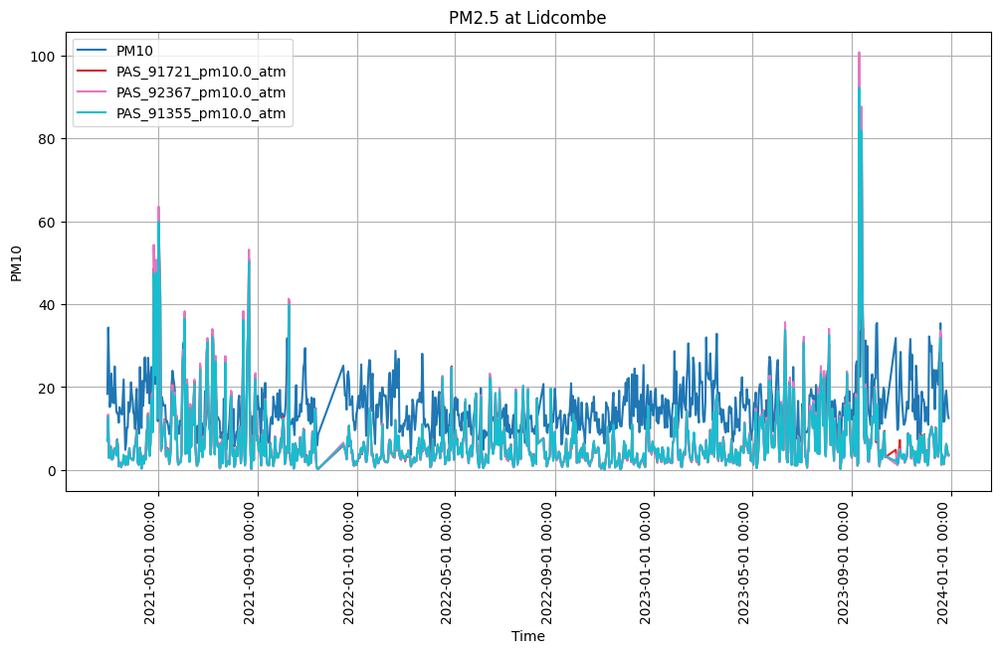

param HUMID
filename:  fig\eda\colocation\Lidcombe\tseries\20210301_20231231\PM10\Lidcombe_HUMID_20210301_20231231_daily.png


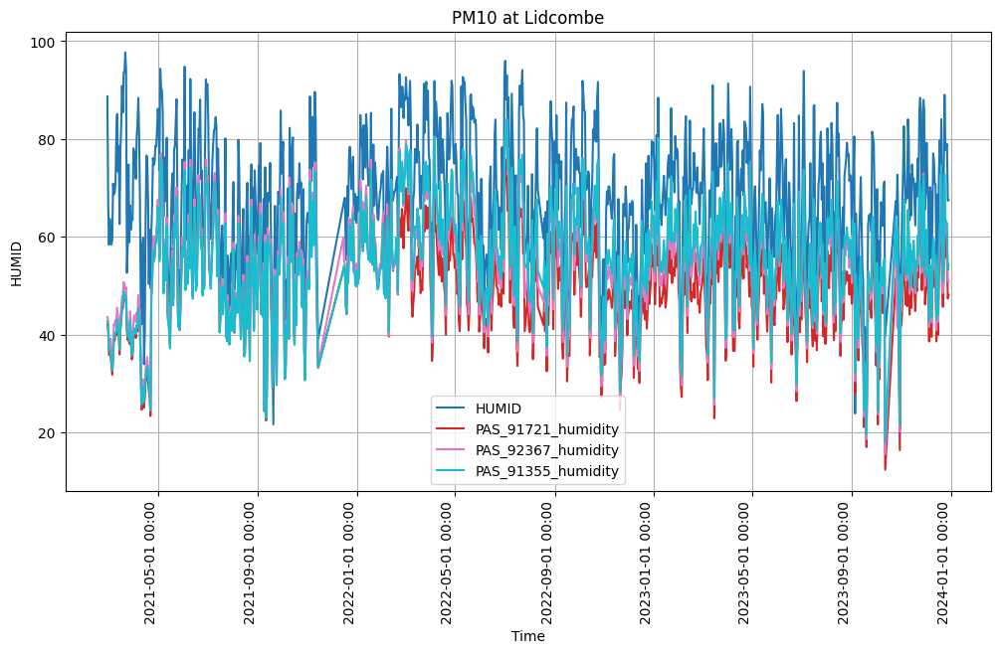

param TEMP
filename:  fig\eda\colocation\Lidcombe\tseries\20210301_20231231\PM10\Lidcombe_TEMP_20210301_20231231_daily.png


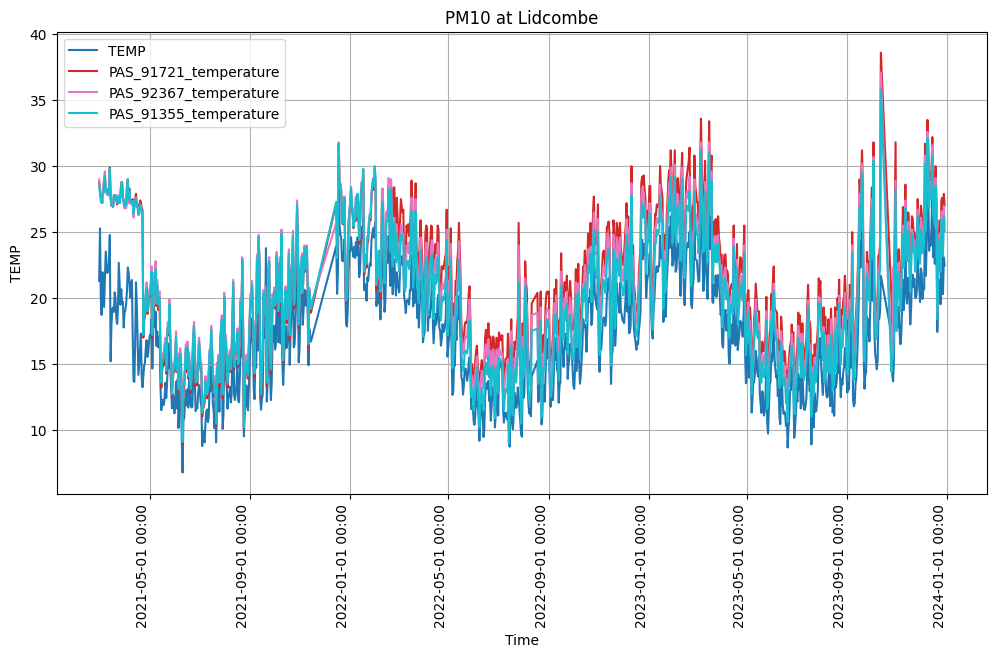

param PM2.5
filename:  fig\eda\colocation\Lidcombe\tseries\20210301_20231231\PM10\Lidcombe_PM2.5_20210301_20231231_daily.png


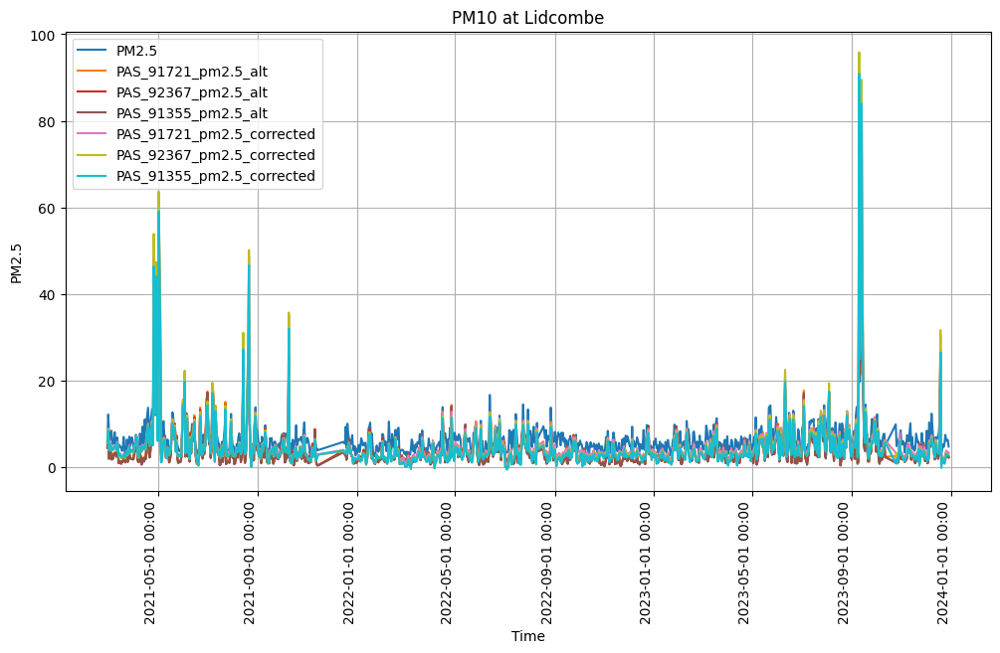

param PM10
filename:  fig\eda\colocation\Lidcombe\tseries\20210301_20231231\PM10\Lidcombe_PM10_20210301_20231231_daily.png


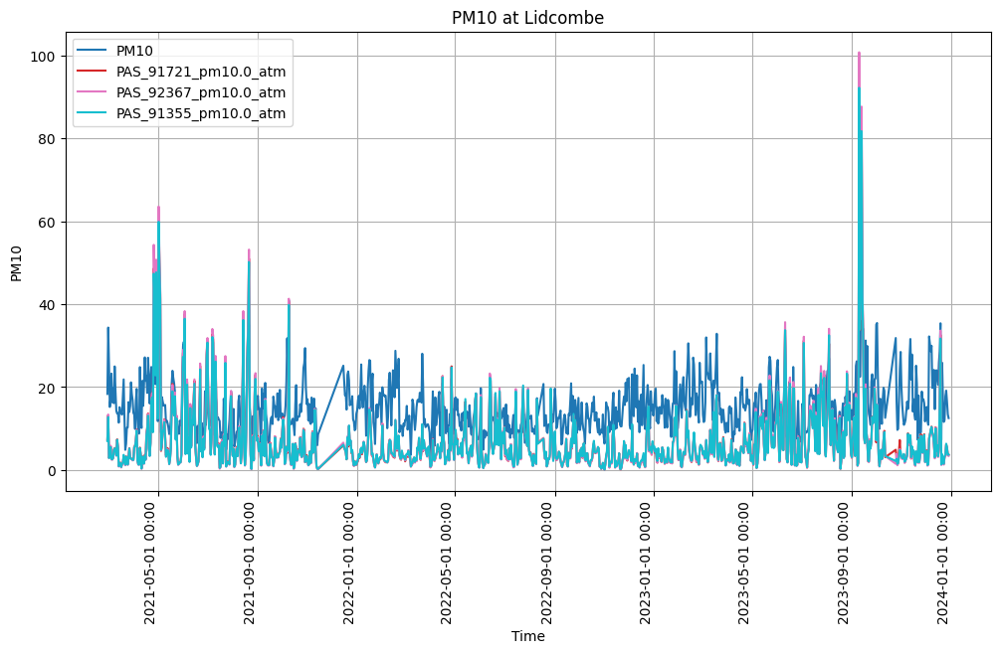

Site:  Millthorpe
tseries_data plot data:  {'HUMID':                                HUMID  PAS_182853_humidity
datetime_utc                                             
2023-07-27 00:00:00+00:00  78.638333               48.667
2023-07-28 00:00:00+00:00  76.364800               53.738
2023-07-29 00:00:00+00:00  92.580778               53.242
2023-07-30 00:00:00+00:00  82.991750               54.338
2023-07-31 00:00:00+00:00  82.685625               55.990
...                              ...                  ...
2024-05-25 00:00:00+00:00  81.861292               53.389
2024-05-26 00:00:00+00:00  79.804667               51.689
2024-05-27 00:00:00+00:00  76.624625               50.799
2024-05-28 00:00:00+00:00  67.411750               45.890
2024-05-29 00:00:00+00:00  70.795208               48.459

[301 rows x 2 columns], 'TEMP':                                 TEMP  PAS_182853_temperature
datetime_utc                                                
2023-07-27 00:00:00+00:00   7.176667  

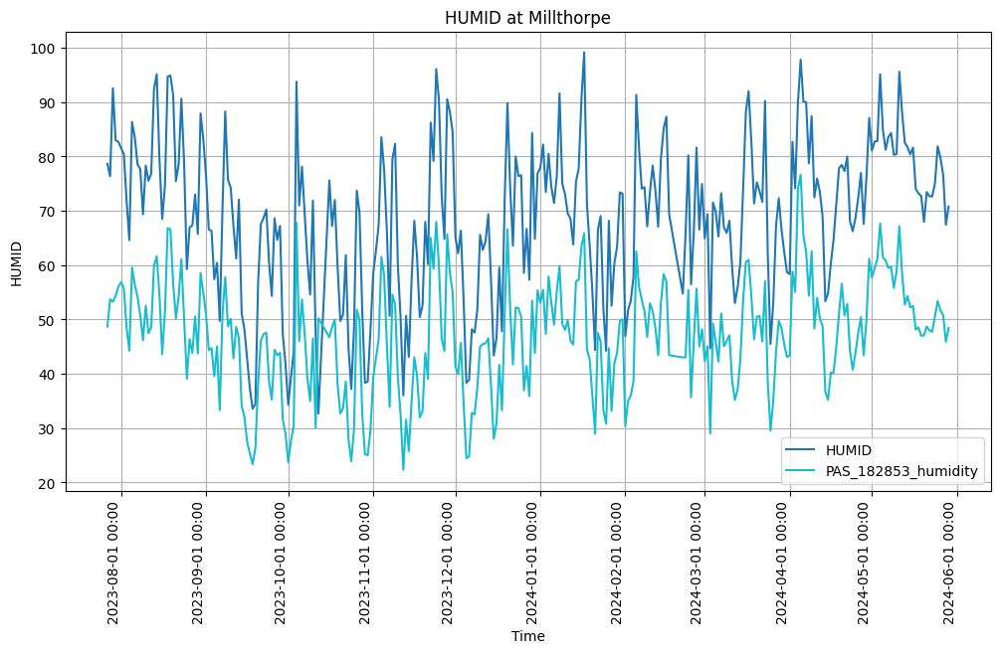

param TEMP
filename:  fig\eda\colocation\Millthorpe\tseries\20230701_20240531\HUMID\Millthorpe_TEMP_20230701_20240531_daily.png


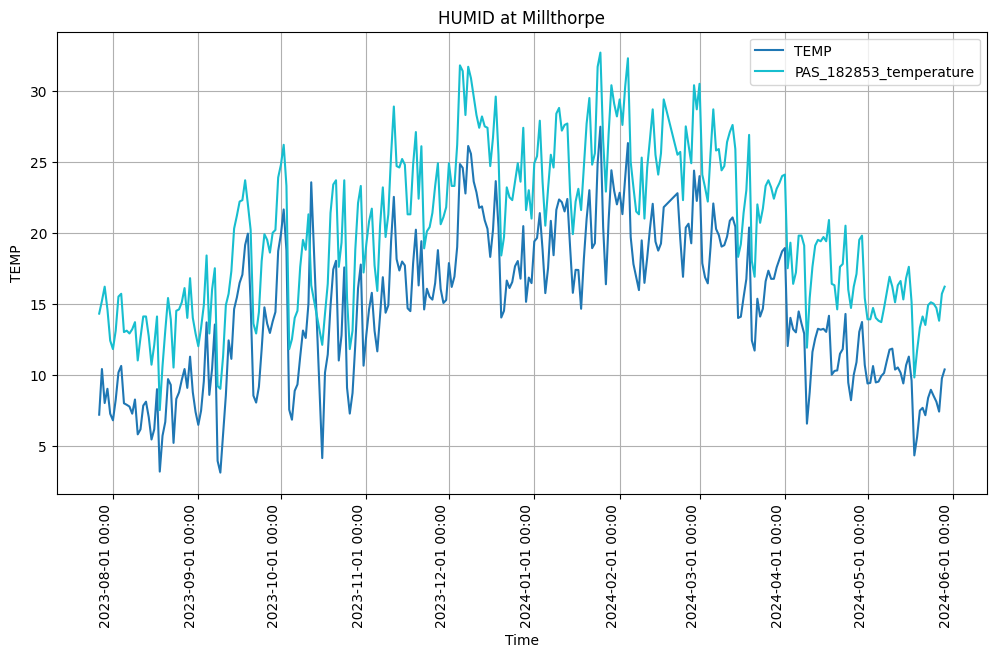

param PM2.5
filename:  fig\eda\colocation\Millthorpe\tseries\20230701_20240531\HUMID\Millthorpe_PM2.5_20230701_20240531_daily.png


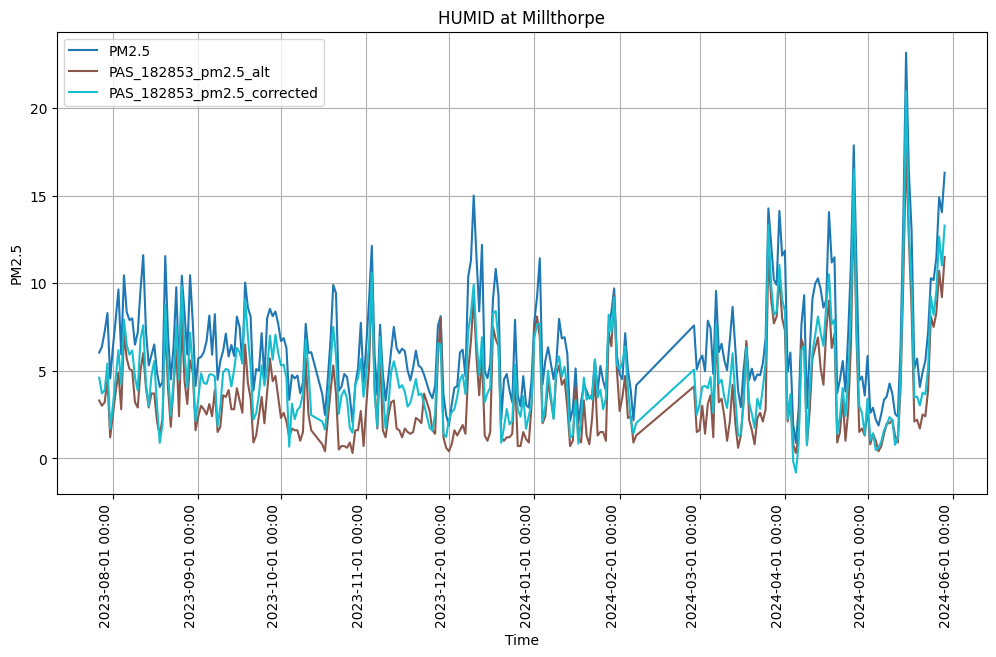

param PM10
filename:  fig\eda\colocation\Millthorpe\tseries\20230701_20240531\HUMID\Millthorpe_PM10_20230701_20240531_daily.png


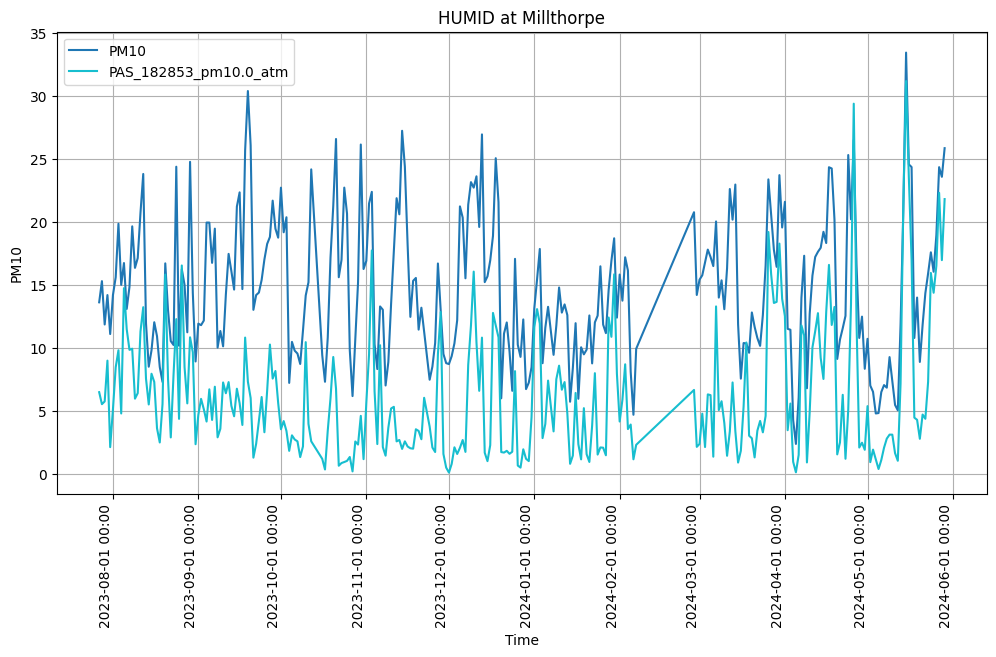

param HUMID
filename:  fig\eda\colocation\Millthorpe\tseries\20230701_20240531\TEMP\Millthorpe_HUMID_20230701_20240531_daily.png


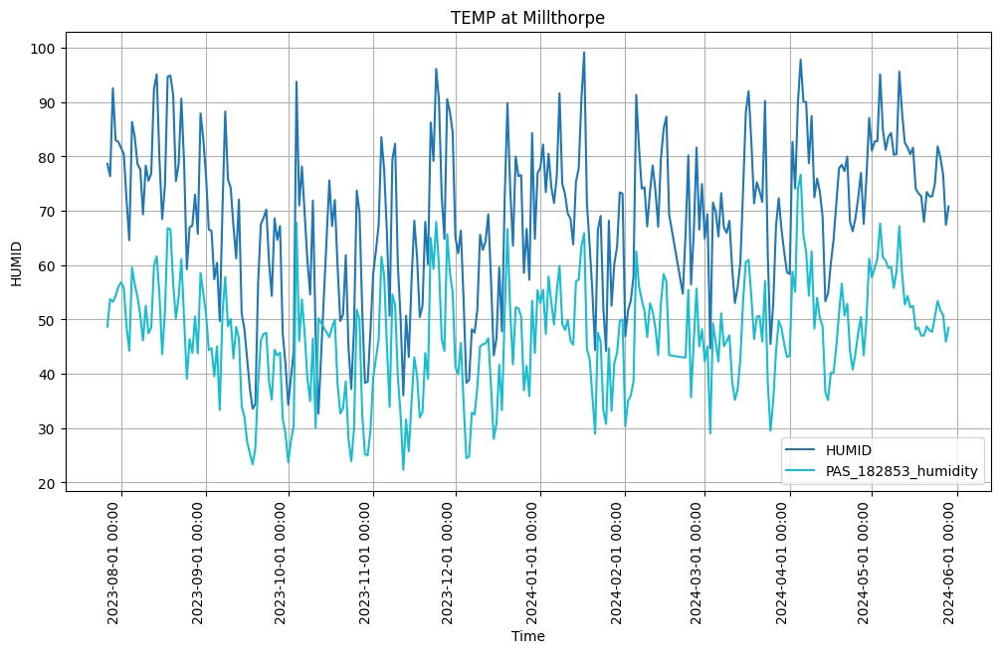

param TEMP
filename:  fig\eda\colocation\Millthorpe\tseries\20230701_20240531\TEMP\Millthorpe_TEMP_20230701_20240531_daily.png


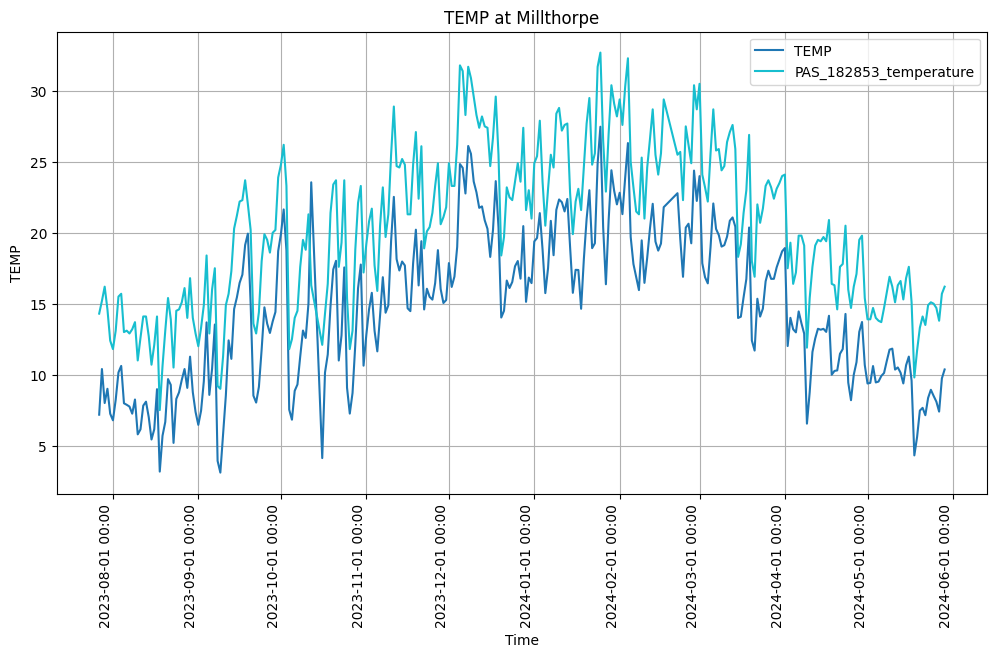

param PM2.5
filename:  fig\eda\colocation\Millthorpe\tseries\20230701_20240531\TEMP\Millthorpe_PM2.5_20230701_20240531_daily.png


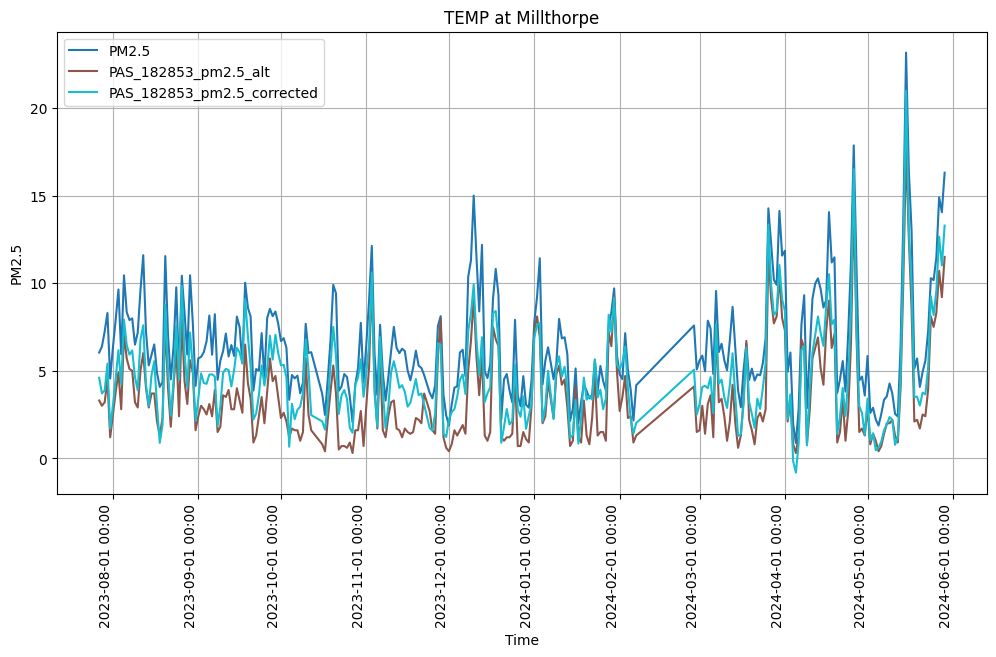

param PM10
filename:  fig\eda\colocation\Millthorpe\tseries\20230701_20240531\TEMP\Millthorpe_PM10_20230701_20240531_daily.png


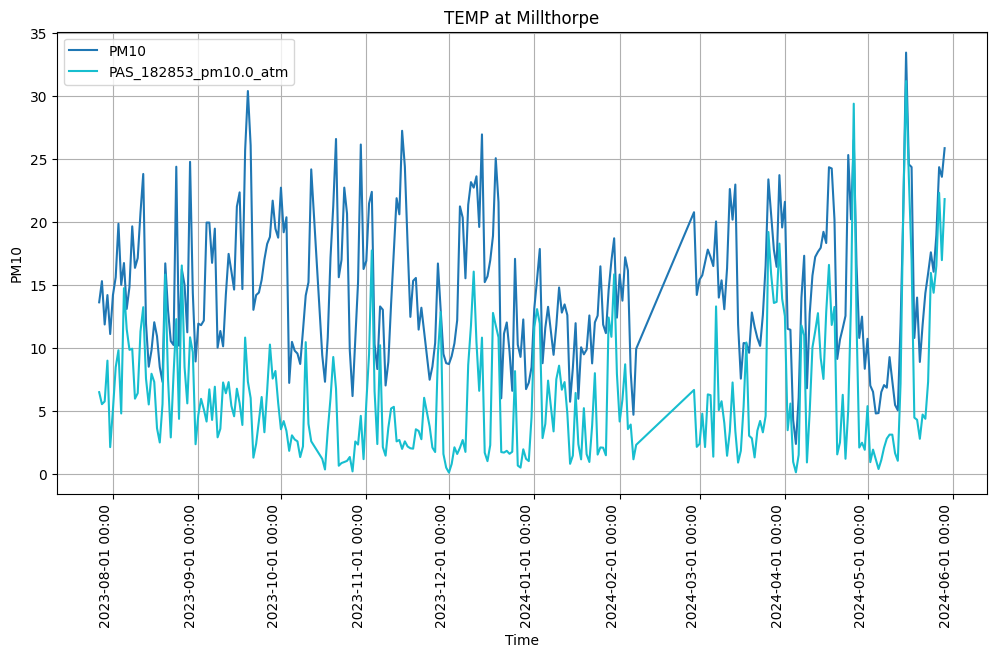

param HUMID
filename:  fig\eda\colocation\Millthorpe\tseries\20230701_20240531\PM2.5\Millthorpe_HUMID_20230701_20240531_daily.png


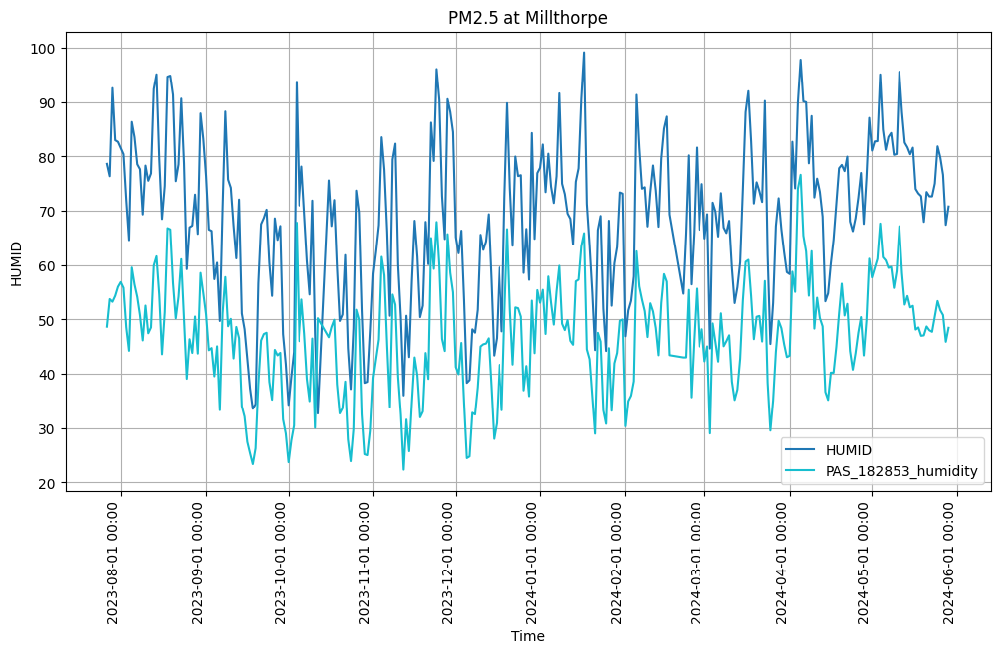

param TEMP
filename:  fig\eda\colocation\Millthorpe\tseries\20230701_20240531\PM2.5\Millthorpe_TEMP_20230701_20240531_daily.png


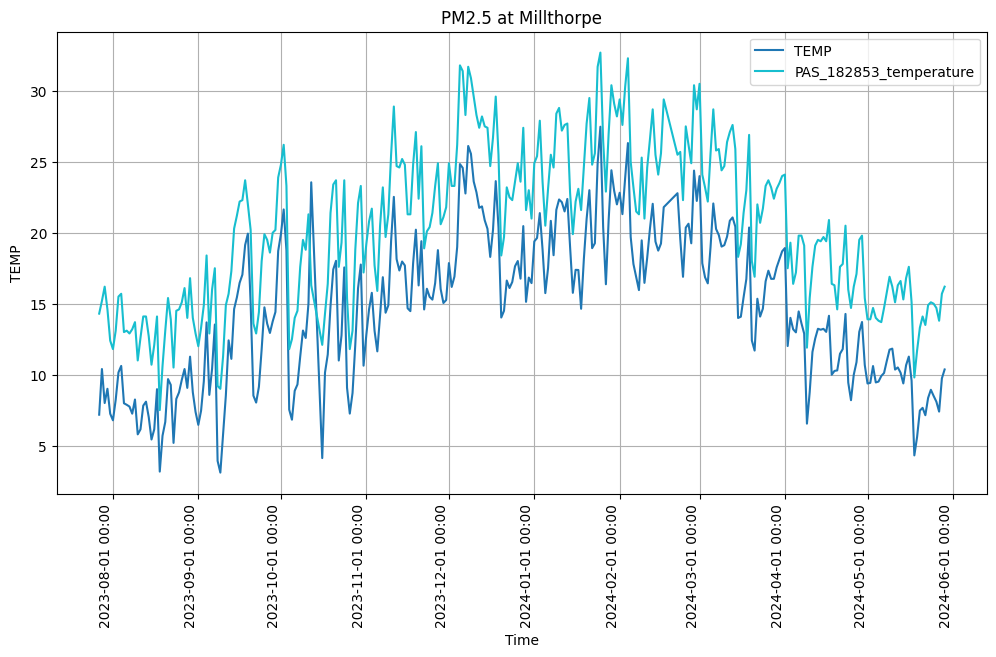

param PM2.5
filename:  fig\eda\colocation\Millthorpe\tseries\20230701_20240531\PM2.5\Millthorpe_PM2.5_20230701_20240531_daily.png


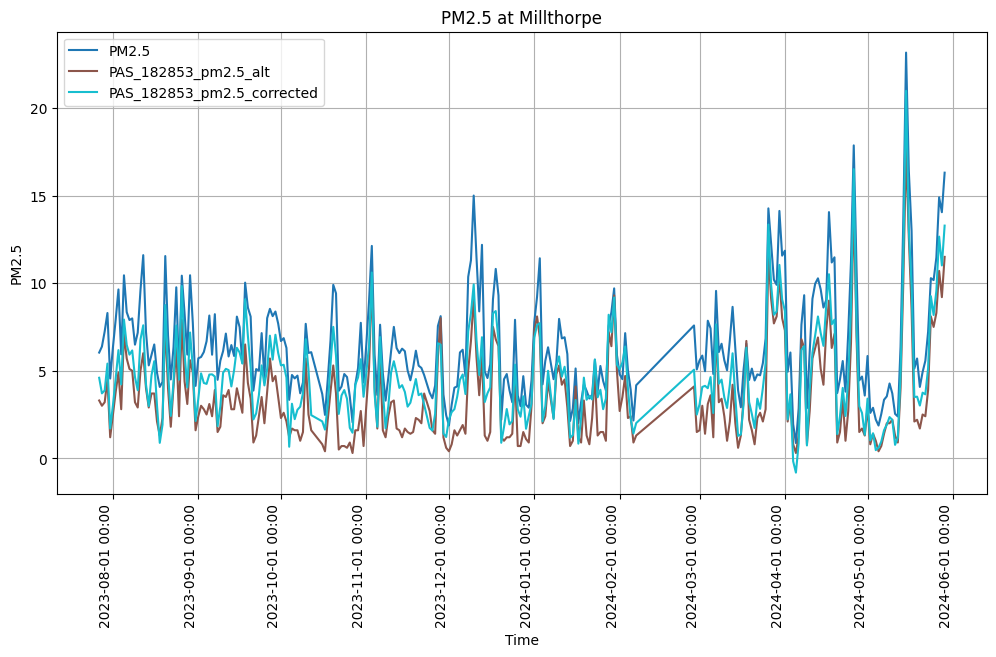

param PM10
filename:  fig\eda\colocation\Millthorpe\tseries\20230701_20240531\PM2.5\Millthorpe_PM10_20230701_20240531_daily.png


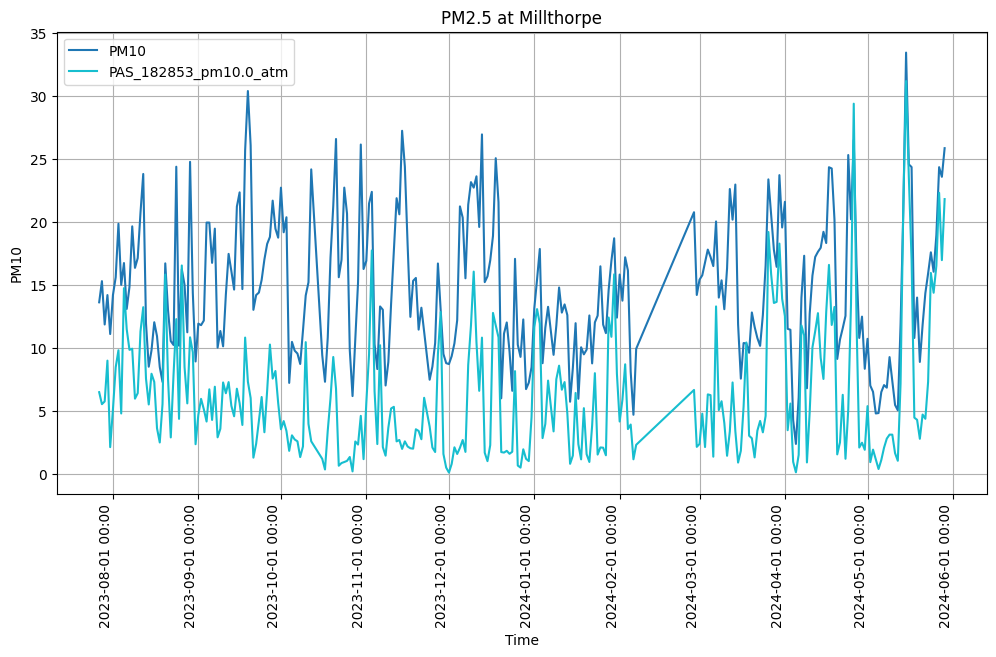

param HUMID
filename:  fig\eda\colocation\Millthorpe\tseries\20230701_20240531\PM10\Millthorpe_HUMID_20230701_20240531_daily.png


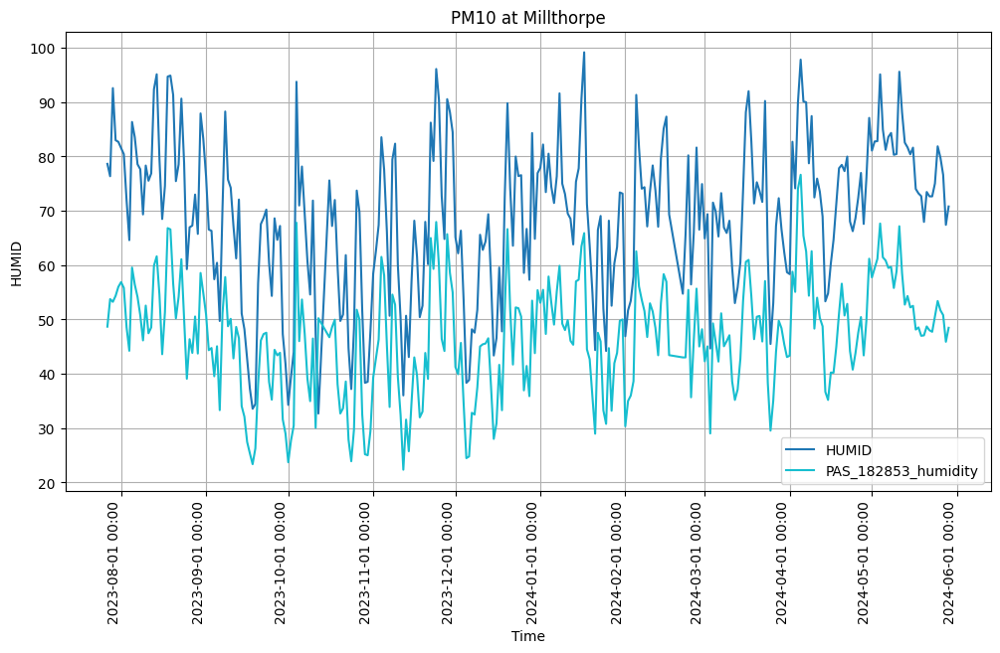

param TEMP
filename:  fig\eda\colocation\Millthorpe\tseries\20230701_20240531\PM10\Millthorpe_TEMP_20230701_20240531_daily.png


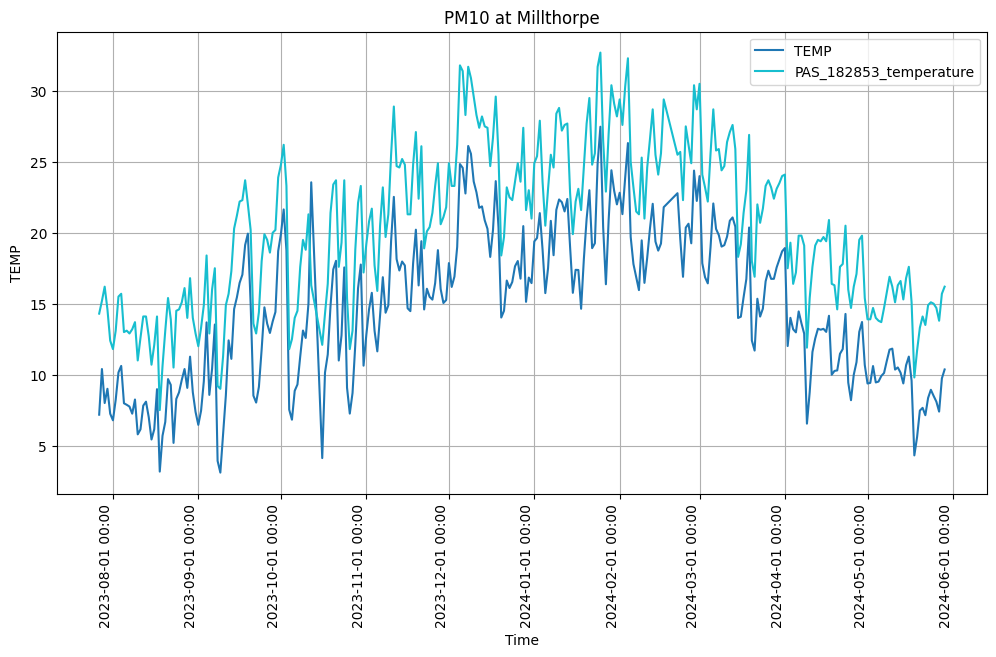

param PM2.5
filename:  fig\eda\colocation\Millthorpe\tseries\20230701_20240531\PM10\Millthorpe_PM2.5_20230701_20240531_daily.png


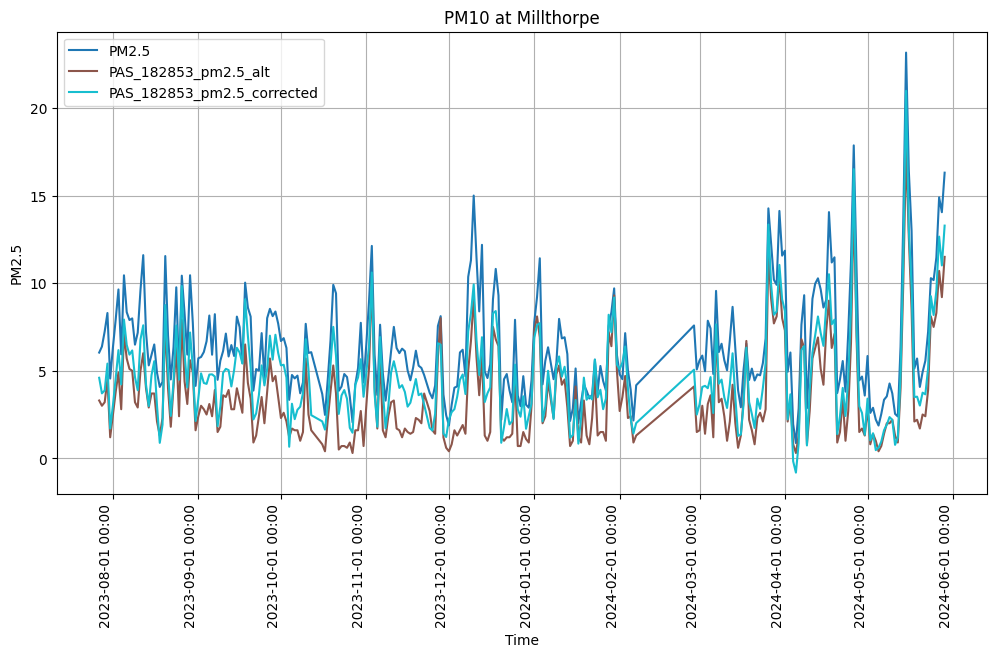

param PM10
filename:  fig\eda\colocation\Millthorpe\tseries\20230701_20240531\PM10\Millthorpe_PM10_20230701_20240531_daily.png


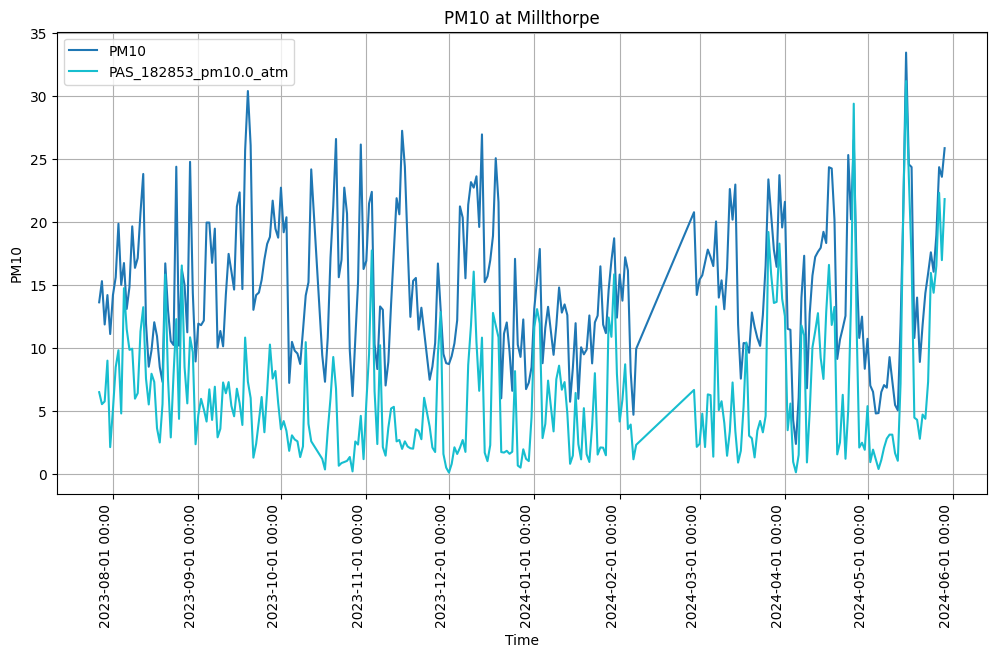

Site:  Wagga_Wagga_North
tseries_data plot data:  {'HUMID':                                HUMID  PAS_29959_humidity  PAS_29945_humidity  \
datetime_utc                                                                   
2019-04-02 00:00:00+00:00  72.303947              24.932              25.018   
2019-04-04 00:00:00+00:00  58.045176              25.500              26.438   
2019-05-12 00:00:00+00:00  81.366375              31.570              29.468   
2019-05-13 00:00:00+00:00  80.806208              36.247              34.781   
2019-05-14 00:00:00+00:00  79.691208              36.308              36.628   
...                              ...                 ...                 ...   
2024-05-25 00:00:00+00:00  76.251750              87.708              54.851   
2024-05-26 00:00:00+00:00  74.855792              85.990              53.585   
2024-05-27 00:00:00+00:00  74.293875              85.639              52.949   
2024-05-28 00:00:00+00:00  75.355522              83.067    

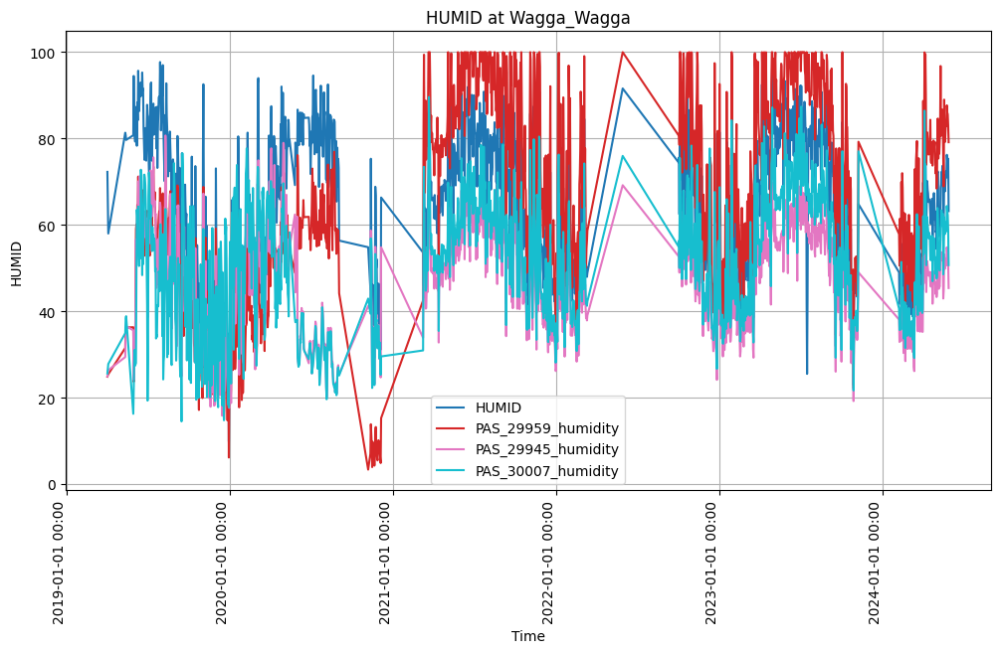

param TEMP
filename:  fig\eda\colocation\Wagga_Wagga\tseries\20190401_20240531\HUMID\Wagga_Wagga_TEMP_20190401_20240531_daily.png


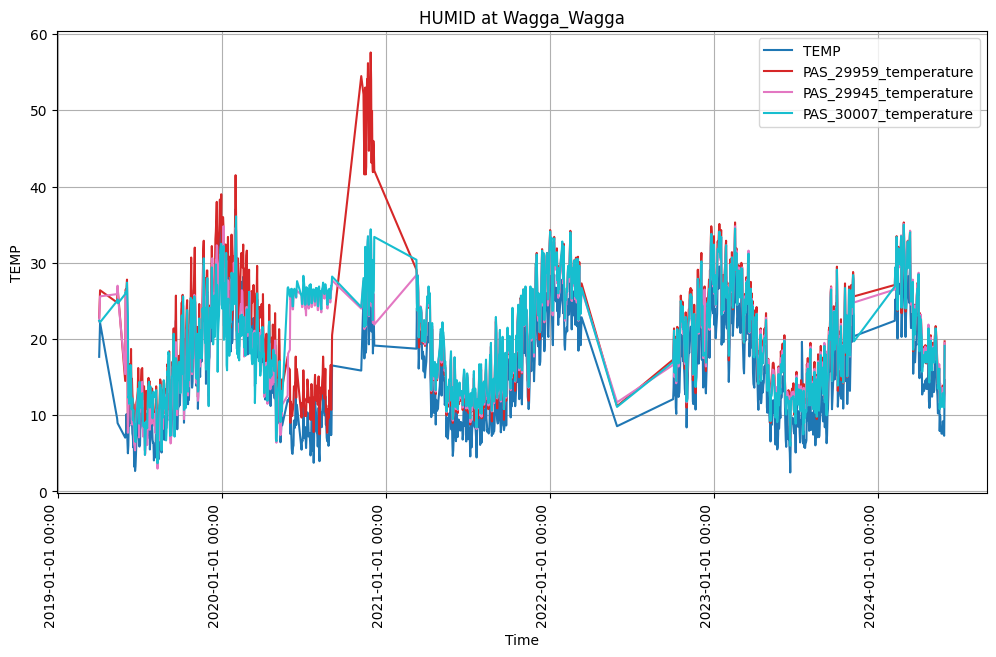

param PM2.5
filename:  fig\eda\colocation\Wagga_Wagga\tseries\20190401_20240531\HUMID\Wagga_Wagga_PM2.5_20190401_20240531_daily.png


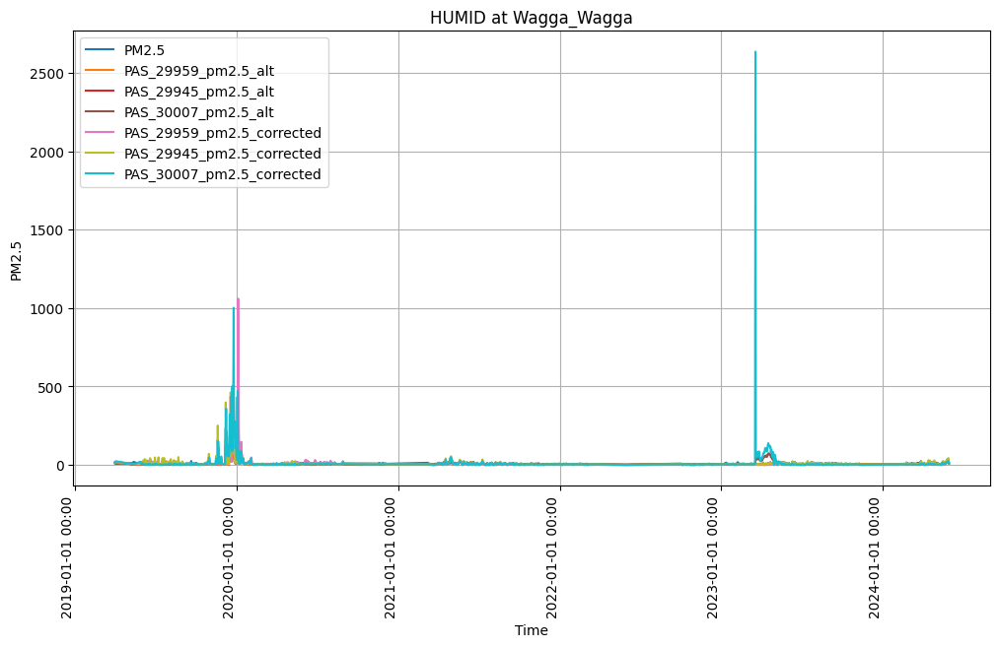

param PM10
filename:  fig\eda\colocation\Wagga_Wagga\tseries\20190401_20240531\HUMID\Wagga_Wagga_PM10_20190401_20240531_daily.png


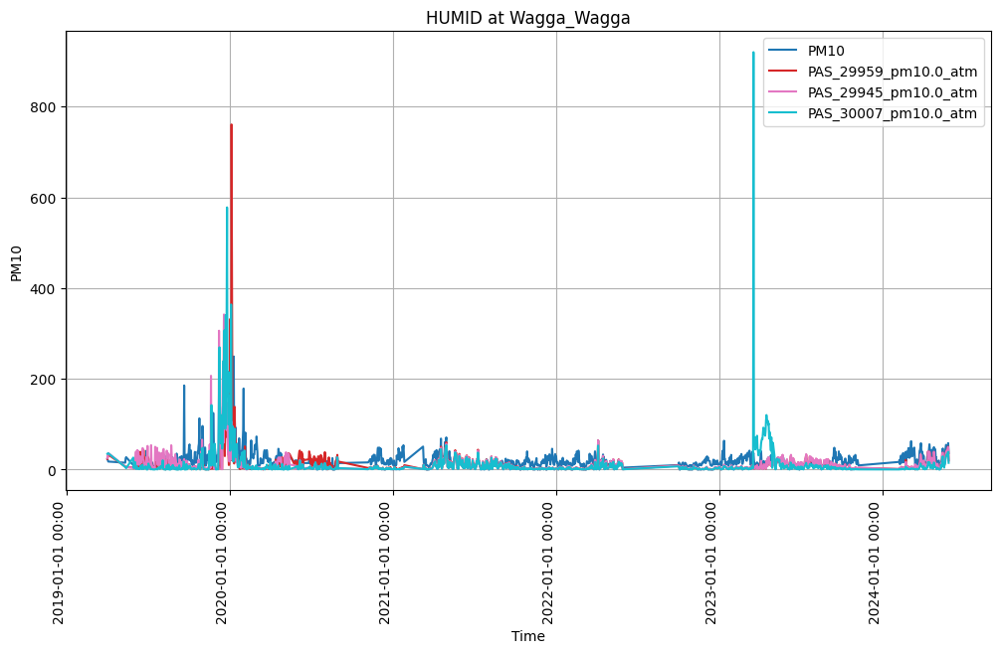

param HUMID
filename:  fig\eda\colocation\Wagga_Wagga\tseries\20190401_20240531\TEMP\Wagga_Wagga_HUMID_20190401_20240531_daily.png


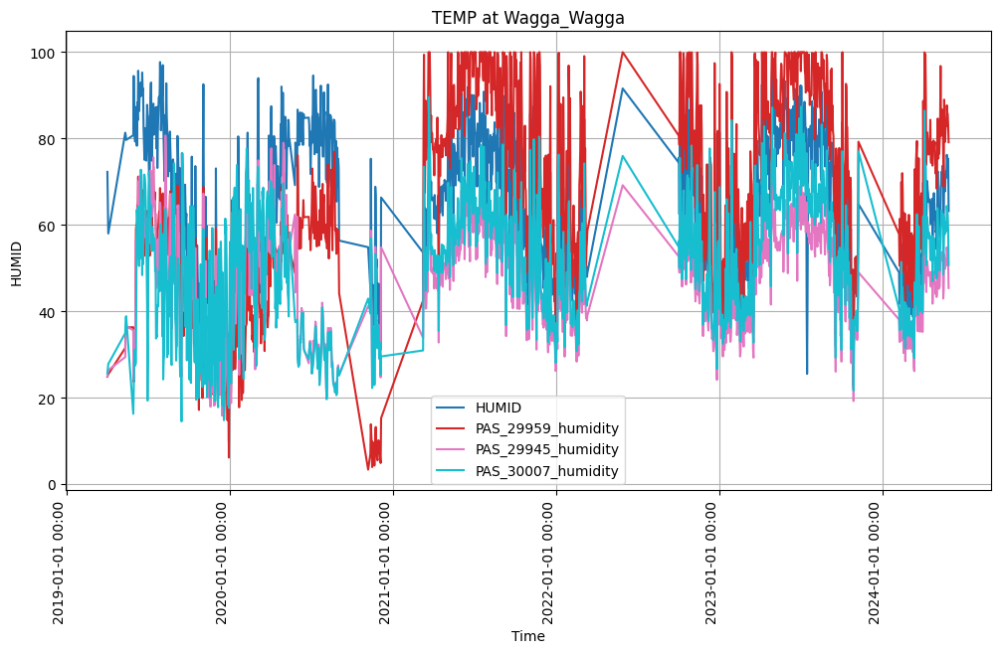

param TEMP
filename:  fig\eda\colocation\Wagga_Wagga\tseries\20190401_20240531\TEMP\Wagga_Wagga_TEMP_20190401_20240531_daily.png


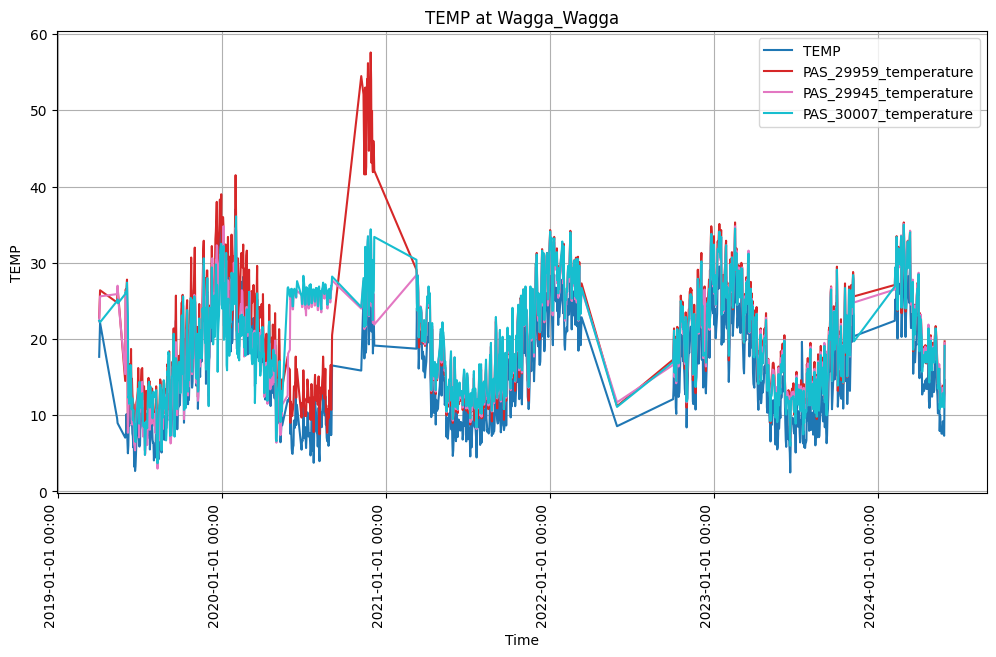

param PM2.5
filename:  fig\eda\colocation\Wagga_Wagga\tseries\20190401_20240531\TEMP\Wagga_Wagga_PM2.5_20190401_20240531_daily.png


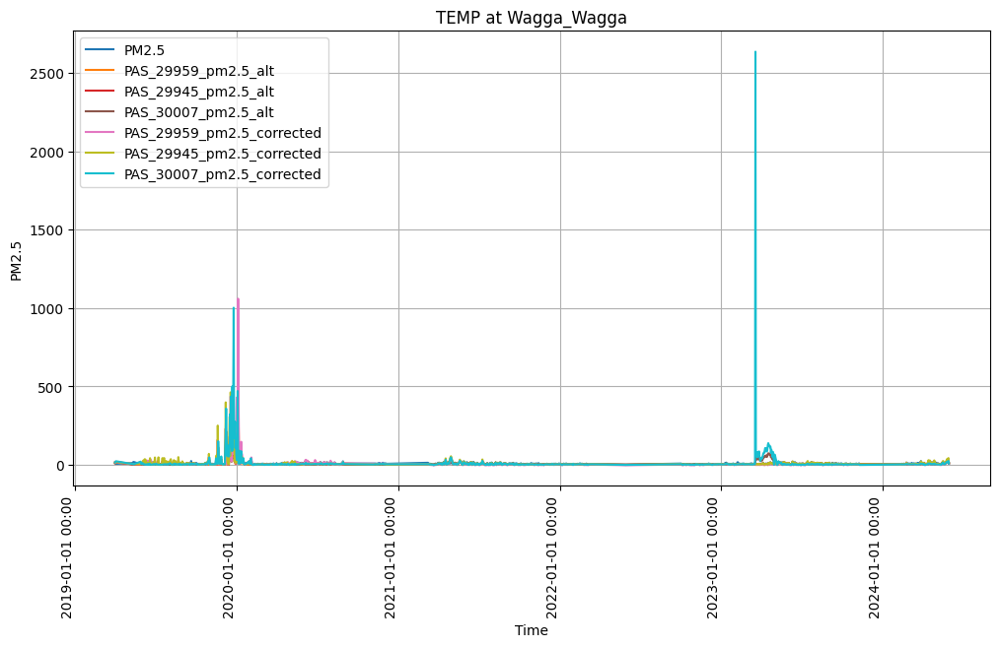

param PM10
filename:  fig\eda\colocation\Wagga_Wagga\tseries\20190401_20240531\TEMP\Wagga_Wagga_PM10_20190401_20240531_daily.png


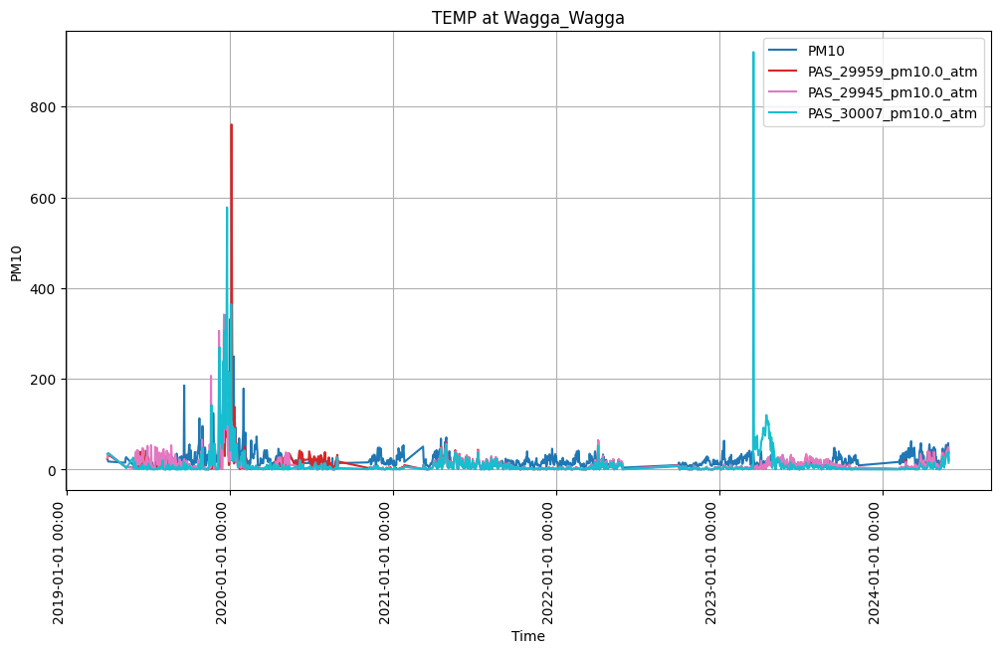

param HUMID
filename:  fig\eda\colocation\Wagga_Wagga\tseries\20190401_20240531\PM2.5\Wagga_Wagga_HUMID_20190401_20240531_daily.png


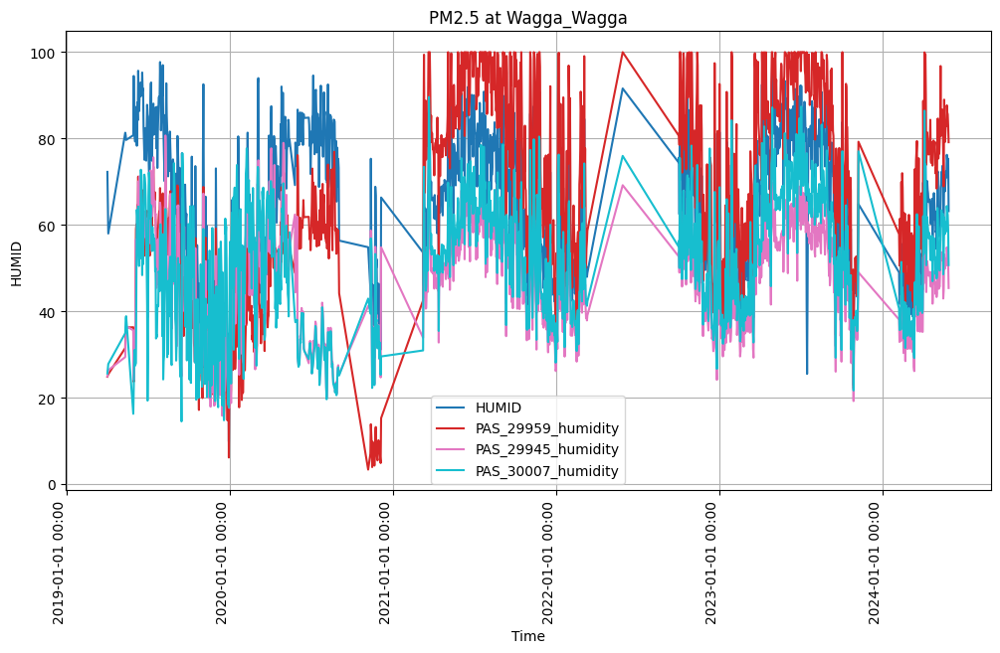

param TEMP
filename:  fig\eda\colocation\Wagga_Wagga\tseries\20190401_20240531\PM2.5\Wagga_Wagga_TEMP_20190401_20240531_daily.png


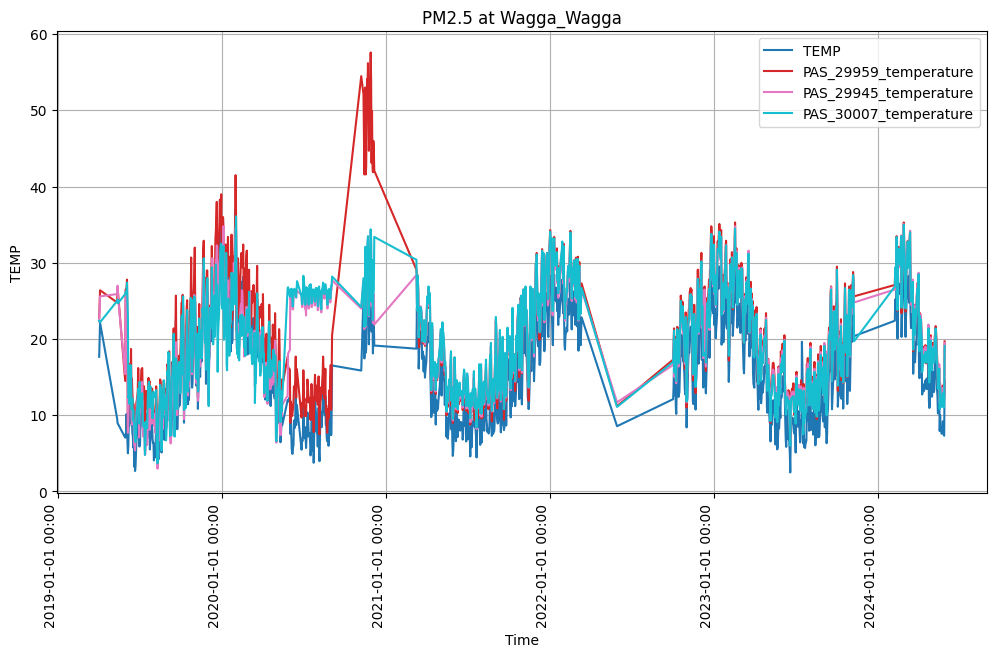

param PM2.5
filename:  fig\eda\colocation\Wagga_Wagga\tseries\20190401_20240531\PM2.5\Wagga_Wagga_PM2.5_20190401_20240531_daily.png


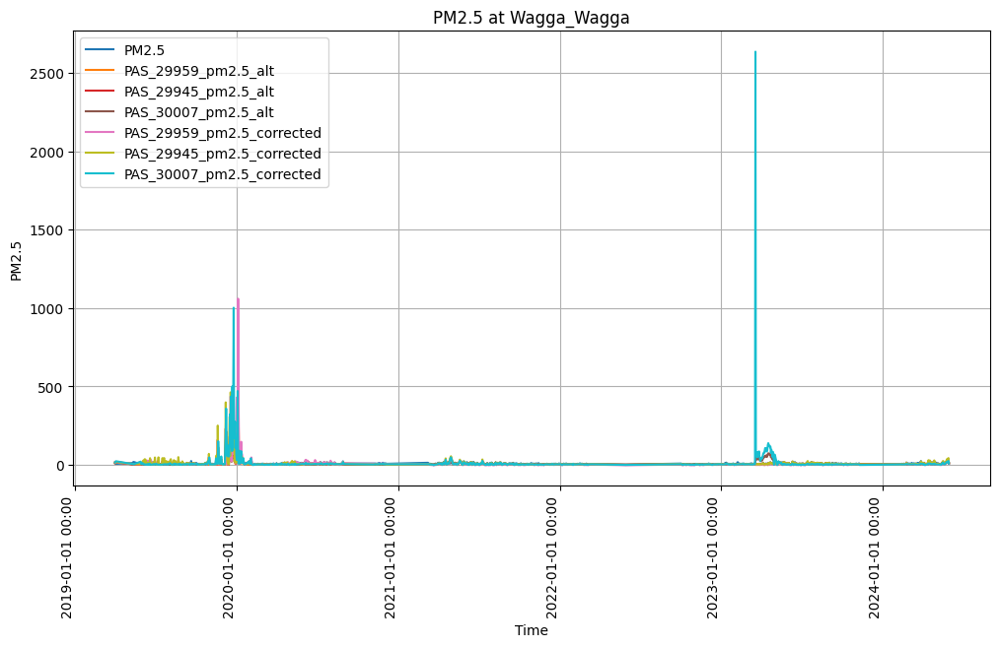

param PM10
filename:  fig\eda\colocation\Wagga_Wagga\tseries\20190401_20240531\PM2.5\Wagga_Wagga_PM10_20190401_20240531_daily.png


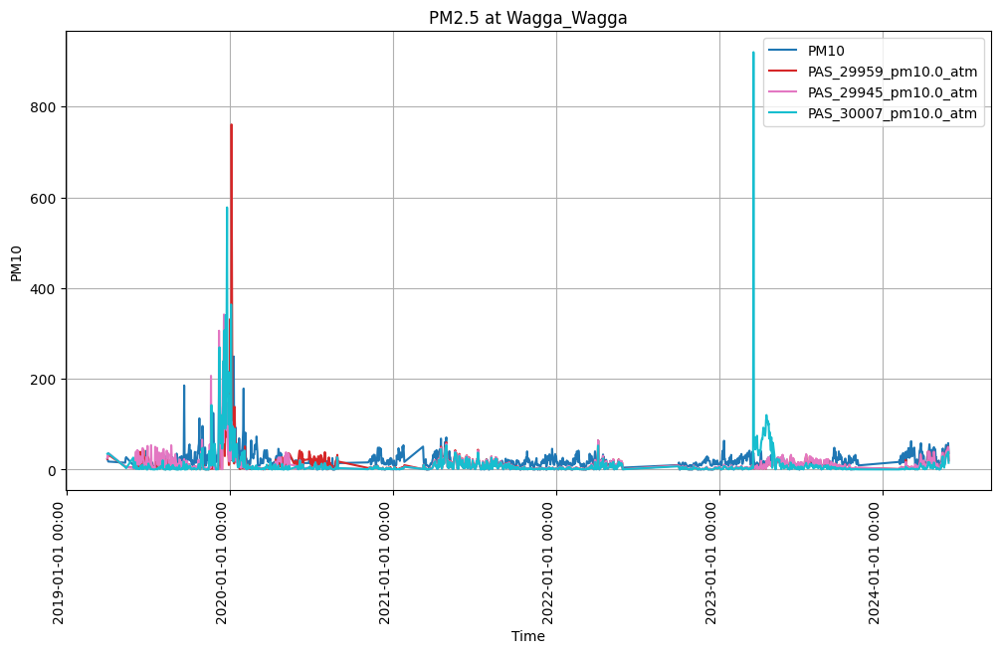

param HUMID
filename:  fig\eda\colocation\Wagga_Wagga\tseries\20190401_20240531\PM10\Wagga_Wagga_HUMID_20190401_20240531_daily.png


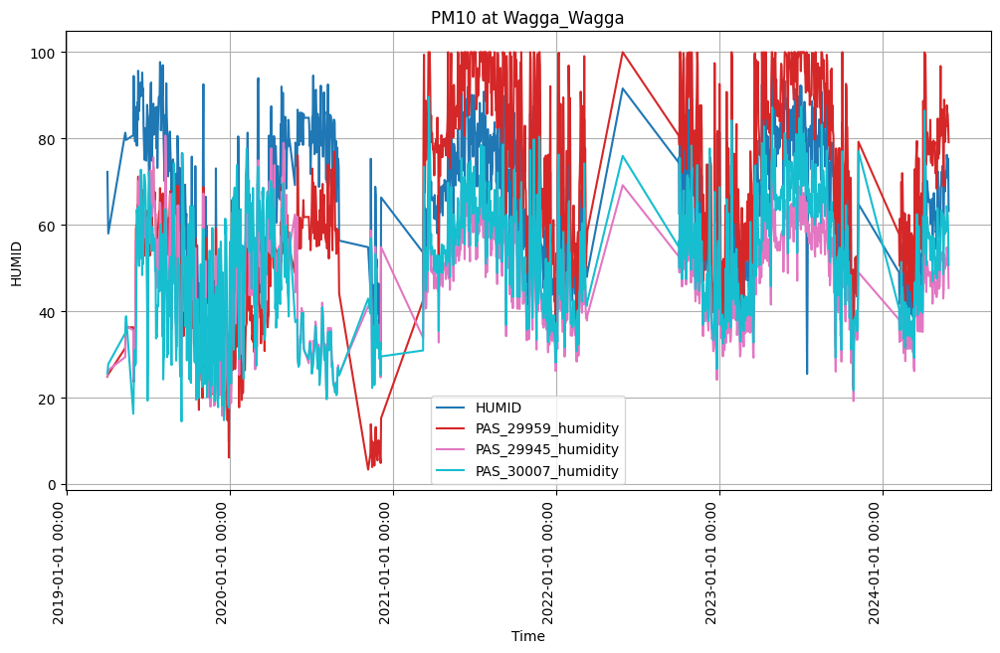

param TEMP
filename:  fig\eda\colocation\Wagga_Wagga\tseries\20190401_20240531\PM10\Wagga_Wagga_TEMP_20190401_20240531_daily.png


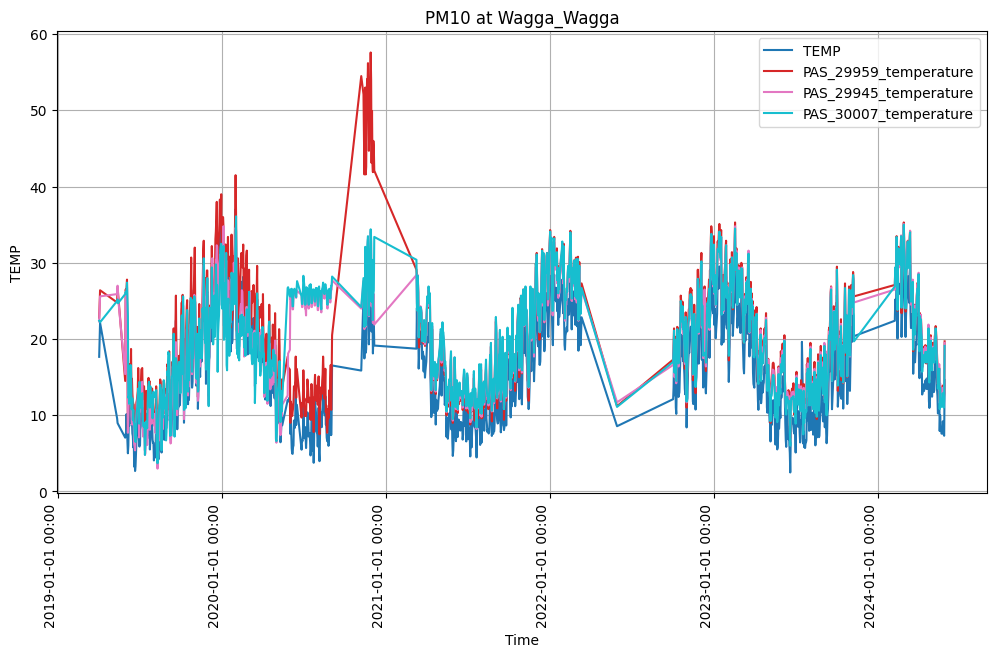

param PM2.5
filename:  fig\eda\colocation\Wagga_Wagga\tseries\20190401_20240531\PM10\Wagga_Wagga_PM2.5_20190401_20240531_daily.png


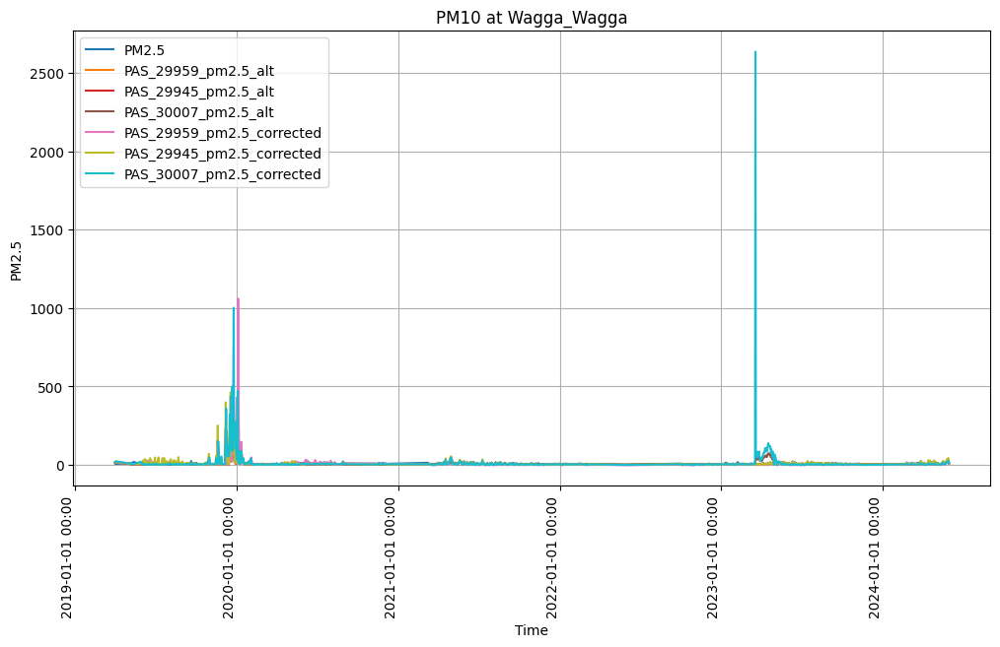

param PM10
filename:  fig\eda\colocation\Wagga_Wagga\tseries\20190401_20240531\PM10\Wagga_Wagga_PM10_20190401_20240531_daily.png


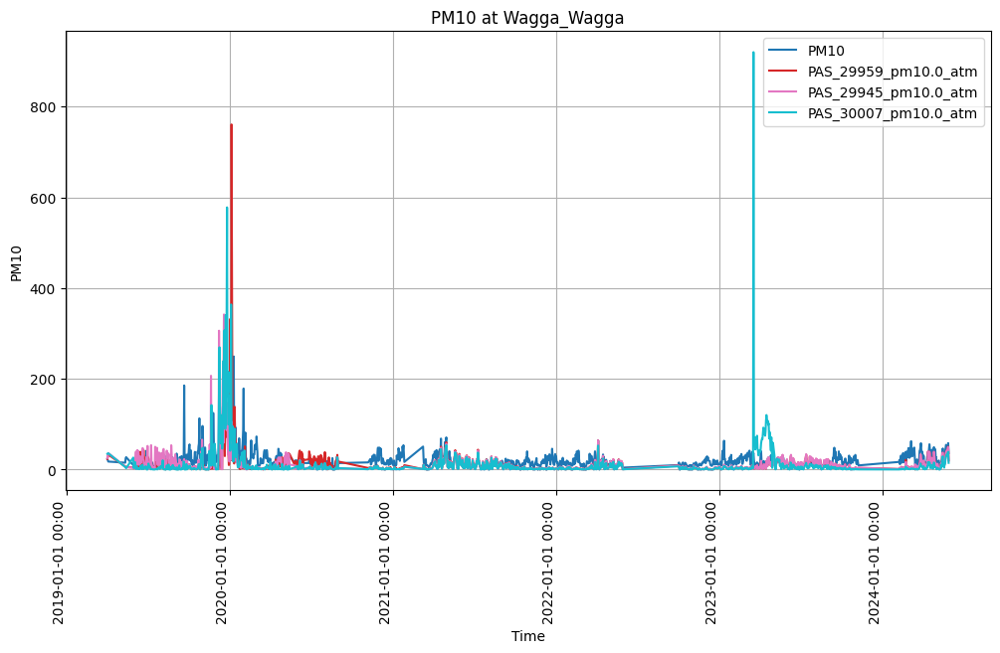

In [3]:
def load_and_prepare_all_sites(metadata_file, freq):
    metadata = load_colocation_data(metadata_file)

    for location, details in metadata.items():
        aqms_details = details.get("AQMS", {})
        site_id = details["AQMS"]["site_id"]
        aqms_start_date, aqms_end_date = aqms_details["data_range"]

        sensors = details.get("PAS", {})
        pas_filepaths = {}
        for sensor_id, sensor_details in sensors.items():
            sensor_start_date, sensor_end_date = sensor_details["data_range"]

            start_date = max(aqms_start_date, sensor_start_date)
            end_date = min(aqms_end_date, sensor_end_date)

            start_date_formatted = start_date.replace("-", "")
            end_date_formatted = end_date.replace("-", "")
            aqms_filepath = f"../../../data/processed/colocation/{location}/AQMS/{start_date_formatted}_{end_date_formatted}/aqms_{site_id}_{start_date_formatted}_{end_date_formatted}_{freq}.csv"
            pas_filepath = f"../../../data/processed/colocation/{location}/PAS/{sensor_id}/{start_date_formatted}_{end_date_formatted}/pas_{sensor_id}_{start_date_formatted}_{end_date_formatted}_{freq}.csv"
            pas_filepaths[sensor_id] = pas_filepath

        aqms_data, pas_data = load_site_data(
            aqms_filepath,
            pas_filepaths,
        )
        print("Site: ", location)
        parameters = list(HEADER_MAPPING.keys())

        tseries_data = prepare_time_series_data(aqms_data, pas_data, HEADER_MAPPING)

        print("tseries_data plot data: ", tseries_data)
        for parameter in parameters:

            if location == "Wagga_Wagga_North":
                location = "Wagga_Wagga"
            folderpathdir = os.path.join(
                "fig",
                "eda",
                "colocation",
                location,
                "tseries",
                f"{start_date_formatted}_{end_date_formatted}",
                parameter,
            )

            if not os.path.exists(folderpathdir):
                os.makedirs(folderpathdir)

            for param, plot_data in tseries_data.items():
                print("param", param)
                filename = os.path.join(
                    folderpathdir,
                    f"{location}_{param}_{start_date_formatted}_{end_date_formatted}_{freq}.png",
                )
                print("filename: ", filename)
                plot_time_series(
                    plot_data,
                    y_columns=plot_data.columns,
                    title=f"{parameter} at {location}",
                    xlabel=f"Time",
                    ylabel=f"{param}",
                    save_dir=filename,
                )


descriptions = {"pm2.5_alt": "raw", "pm2.5_corrected": "corrected", "pm2.5_dsi": "dsi"}
metadata_file = "../../../metadata/colocation/colocation.json"
freq = "daily"
load_and_prepare_all_sites(metadata_file, freq)


In [4]:
# import os
# import matplotlib.pyplot as plt
# import matplotlib.dates as mdates
# import pandas as pd
# import numpy as np


# def plot_time_series(
#     data,
#     x_column,
#     y_columns,
#     title=None,
#     xlabel=None,
#     ylabel=None,
#     colors=None,
#     linestyles=None,
#     linewidths=None,
#     alpha=1.0,
#     save_dir=None,
#     figsize=(12, 6),
#     date_format="%Y-%m-%d %H:%M",
#     legend_loc="best",
#     show=True,
# ):
#     """
#     Plots and saves a time series plot.

#     Args:
#         data (pd.DataFrame or dict of pd.DataFrame): The time series data.
#         x_column (str): The column name for x-axis (time).
#         y_columns (list of str): The column names for y-axis (values).
#         title (str): Title of the plot.
#         xlabel (str): Label for x-axis.
#         ylabel (str): Label for y-axis.
#         colors (list of str): List of colors for each line.
#         linestyles (list of str): List of line styles for each line.
#         linewidths (list of float): List of line widths for each line.
#         alpha (float): Transparency level for the lines.
#         save_dir (str): Directory to save the plot.
#         figsize (tuple): Size of the figure.
#         date_format (str): Date format for x-axis.
#         legend_loc (str): Location of the legend.
#         show (bool): Whether to show the plot.
#     """
#     # Ensure colors, linestyles, and linewidths are lists of appropriate length
#     num_series = len(y_columns)
#     if colors is None:
#         colors = plt.cm.tab10(np.linspace(0, 1, num_series))
#     if linestyles is None:
#         linestyles = ["-"] * num_series
#     if linewidths is None:
#         linewidths = [1.5] * num_series

#     # Prepare the plot
#     fig, ax = plt.subplots(figsize=figsize)

#     # Plot each time series
#     for i, y_column in enumerate(y_columns):
#         color = colors[i % len(colors)]
#         linestyle = linestyles[i % len(linestyles)]
#         linewidth = linewidths[i % len(linewidths)]
#         label = y_column

#         if isinstance(data, dict):
#             for key, df in data.items():
#                 ax.plot(
#                     df[x_column],
#                     df[y_column],
#                     label=f"{key} - {label}",
#                     color=color,
#                     linestyle=linestyle,
#                     linewidth=linewidth,
#                     alpha=alpha,
#                 )
#         else:
#             ax.plot(
#                 data[x_column],
#                 data[y_column],
#                 label=label,
#                 color=color,
#                 linestyle=linestyle,
#                 linewidth=linewidth,
#                 alpha=alpha,
#             )

#     # Customize the plot
#     ax.set_title(title)
#     ax.set_xlabel(xlabel)
#     ax.set_ylabel(ylabel)
#     ax.xaxis.set_major_formatter(mdates.DateFormatter(date_format))
#     ax.legend(loc=legend_loc)
#     ax.grid(True)

#     # Rotate x-axis labels for better readability
#     plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

#     # Save the figure
#     if save_dir:
#         os.makedirs(os.path.dirname(save_dir), exist_ok=True)
#         plt.savefig(save_dir, bbox_inches="tight")

#     # Show the plot
#     if show:
#         plt.show()

#     # Close the plot to free memory
#     plt.close()


# # Example usage
# if __name__ == "__main__":
#     # Generate example data
#     dates = pd.date_range(start="2023-01-01", periods=100, freq="D")
#     data = pd.DataFrame(
#         {
#             "Date": dates,
#             "Value1": np.random.rand(100).cumsum(),
#             "Value2": np.random.rand(100).cumsum(),
#         }
#     )

#     # Example usage of the function
#     plot_time_series(
#         data=data,
#         x_column="Date",
#         y_columns=["Value1", "Value2"],
#         title="Example Time Series Plot",
#         xlabel="Date",
#         ylabel="Values",
#         colors=["blue", "green"],
#         linestyles=["-", "--"],
#         linewidths=[2.0, 1.0],
#         save_dir="figures/example_time_series_plot.png",
#         figsize=(14, 7),
#         date_format="%Y-%m-%d",
#         legend_loc="upper left",
#     )
